In [1]:
##################################
### Import the usual libraries ###
##################################

#numpy
import numpy as np

# scipy
from scipy.stats import binned_statistic_2d, binned_statistic
from scipy.interpolate import CubicSpline

#astropy
import astropy
from astropy.io import fits, ascii
from astropy.table import Table, Column, QTable

#matplotlib
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.patches as mpatches
from matplotlib.ticker import MultipleLocator, FormatStrFormatter, AutoMinorLocator
from matplotlib.offsetbox import AnchoredText
matplotlib.rcParams.update({'font.size': 18})

# Yumi's Code to convert (RA,DEC) to MS coordinates
import MagellanicStream as ms

# .py files for grad calc
import astrofunctions as astro
import lmcgeometry as lgeo
import mlefitting as mle
import utilities as util

# Ignore warnings unless crashes
import warnings
warnings.filterwarnings('ignore')

#progress bars
from tqdm import tqdm_notebook

In [23]:
pwd

'/Users/joshpovick/Desktop/Research/LMC_Gradients_with_Ages'

In [2]:
# PARSEC Isochrones
parsecall = ascii.read('/Users/joshpovick/Desktop/Research/LMC_Ages/parsec3_3.dat', \
                    format='basic', delimiter='\s')

rgb = np.where(parsecall['label']==3)
parsec = parsecall[rgb]

# LMC r13 data
lmcr13 = fits.getdata('/Users/joshpovick/Desktop/Research/LMC_Ages/lmc_rgbmembers.r13-l33-58672.fits.gz',1)
clnr = np.where((lmcr13['FE_H']>-9999.0)&(lmcr13['AK_TARG']>-9999.0)&(lmcr13['LOGG']>0.0)&
                (lmcr13['M_H_ERR']>-90.0)&(lmcr13['C_FE']>-9999.0)&(lmcr13['N_FE']>-9999.0))

r13 = lmcr13[clnr]
r13_2 = r13[np.where(r13['SNR']>=100)]

ages = fits.getdata('pca_ols_ages.fits')
ages_2 = ages[np.where(r13['SNR']>=100)]

In [3]:
# All Star r12

mwr12 = fits.getdata('/Users/joshpovick/Desktop/Research/LMC_Gradients_with_Ages/allStar-r12-l33.fits.gz',1)
clnmw = np.where((mwr12['FE_H']>-9999.0)&(mwr12['AK_TARG']>-9999.0)&(mwr12['LOGG']>0.0)&
                (mwr12['M_H_ERR']>-90.0)&(mwr12['C_FE']>-9999.0)&(mwr12['N_FE']>-9999.0))

mwr12 = mwr12[clnmw]

### Pick AllStar RGB
mw_rgb = mwr12[np.where((mwr12['LOGG']>=2.65)&(mwr12['SNR']>=100))]

In [4]:
mw_rgb.columns

ColDefs(
    name = 'APSTAR_ID'; format = '57A'
    name = 'TARGET_ID'; format = '47A'
    name = 'ASPCAP_ID'; format = '59A'
    name = 'FILE'; format = '39A'
    name = 'APOGEE_ID'; format = '18A'
    name = 'TELESCOPE'; format = '8A'
    name = 'LOCATION_ID'; format = 'J'
    name = 'FIELD'; format = '16A'
    name = 'J'; format = 'E'
    name = 'J_ERR'; format = 'E'
    name = 'H'; format = 'E'
    name = 'H_ERR'; format = 'E'
    name = 'K'; format = 'E'
    name = 'K_ERR'; format = 'E'
    name = 'RA'; format = 'D'
    name = 'DEC'; format = 'D'
    name = 'GLON'; format = 'D'
    name = 'GLAT'; format = 'D'
    name = 'APOGEE_TARGET1'; format = 'J'
    name = 'APOGEE_TARGET2'; format = 'J'
    name = 'APOGEE_TARGET3'; format = 'J'
    name = 'APOGEE2_TARGET1'; format = 'J'
    name = 'APOGEE2_TARGET2'; format = 'J'
    name = 'APOGEE2_TARGET3'; format = 'J'
    name = 'TARGFLAGS'; format = '192A'
    name = 'SURVEY'; format = '35A'
    name = 'PROGRAMNAME'; format = '18A'
    na

In [5]:
### Radii LMC
x,y,dist = lgeo.LMCdisk_cart(r13_2['RA'],r13_2['DEC'])
radius = lgeo.elliptical_radius(x,y)
     
### All elements APOGEE measures abundances for
elems = ['M_H','C_FE','N_FE','O_FE','NA_FE','MG_FE','AL_FE','SI_FE','P_FE','S_FE','K_FE','CA_FE','TI_FE',
         'TIII_FE','V_FE','CR_FE','MN_FE','FE_H','CO_FE','NI_FE','CU_FE','GE_FE','RB_FE','CE_FE','ND_FE','YB_FE']
elems_err = ['M_H_ERR','C_FE_ERR','N_FE_ERR','O_FE_ERR','NA_FE_ERR','MG_FE_ERR','AL_FE_ERR','SI_FE_ERR',
             'P_FE_ERR','S_FE_ERR','K_FE_ERR','CA_FE_ERR','TI_FE_ERR','TIII_FE_ERR','V_FE_ERR','CR_FE_ERR',
             'MN_FE_ERR','FE_H_ERR','CO_FE_ERR','NI_FE_ERR','CU_FE_ERR','GE_FE_ERR','RB_FE_ERR','CE_FE_ERR',
             'ND_FE_ERR','YB_FE_ERR']

elems = np.asarray(elems)
elems_err= np.asarray(elems_err)

labs = ['[M/H]','[C/Fe]','[N/Fe]','[O/Fe]','[Na/Fe]','[Mg/Fe]','[Al/Fe]','[Si/Fe]','[P/Fe]','[S/Fe]','[K/Fe]',
        '[Ca/Fe]','[Ti/FE]','[Ti II/Fe]','[V/Fe]','[Cr/Fe]','[Mn/Fe]','[Fe/H]','[Co/Fe]','[Ni/Fe]','[Cu/Fe]',
        '[Ge/Fe]','[Rb/Fe]','[Ce/Fe]','[Nd/Fe]','[Yb/FE]']

In [5]:
# plt.scatter(r13['J']-r13['K'],r13['H'])
# plt.scatter((r13['J']-r13['K'])[np.where(r13['K']>12.5)],(r13['H'])[np.where(r13['K']>12.5)])
# # plt.gca().invert_xaxis()
# plt.gca().invert_yaxis()
# plt.show()

# plt.figure(figsize=[10,10])
# plt.scatter(r13['K'],r13['H'],c=r13['LOGG'],cmap='nipy_spectral')
# plt.axvline(12.5,c='r')
# plt.show()
# print('Number stars dimmer than K=12.5: ',len(np.squeeze(np.where(r13['K']>12.5))))

# plt.scatter(r13['K'],r13['LOGG'])
# plt.axvline(12.5,c='r')
# plt.show()

In [6]:
# plt.figure(figsize=[8.5,7])
# plt.scatter(x,y,c=dist,cmap='seismic')
# plt.xlabel(r'X (kpc)')
# plt.ylabel(r'Y (kpc)')
# plt.title(r'Color as Distance (kpc)')
# plt.colorbar()
# plt.show()

# H, xedges, yedges = np.histogram2d(x,y,bins=28,weights=r13['TEFF'])
# H_o, xedges, yedges = np.histogram2d(x,y,bins=28)
# # mask=H_o < 3
# # H_o[mask] = np.nan

# plt.figure(figsize=[12,10])
# plt.imshow(H.T/H_o.T,interpolation='nearest',origin='lower', 
#            extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]],cmap='nipy_spectral')
# plt.colorbar()
# plt.title(r'Color as TEFF')
# plt.xlabel(r'x (kpc)')
# plt.ylabel(r'y (kpc)')
# # plt.savefig('age_map.pdf',bbox_inches='tight')

# H, xedges, yedges = np.histogram2d(x,y,bins=28,weights=r13['LOGG'])
# H_o, xedges, yedges = np.histogram2d(x,y,bins=28)
# # mask=H_o < 3
# # H_o[mask] = np.nan

# plt.figure(figsize=[12,10])
# plt.imshow(H.T/H_o.T,interpolation='nearest',origin='lower', 
#            extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]],cmap='nipy_spectral')
# plt.colorbar()
# plt.title(r'Color as Log(g)')
# plt.xlabel(r'x (kpc)')
# plt.ylabel(r'y (kpc)')

# H, xedges, yedges = np.histogram2d(x,y,bins=28,weights=r13['H'])
# H_o, xedges, yedges = np.histogram2d(x,y,bins=28)
# # mask=H_o < 3
# # H_o[mask] = np.nan

# plt.figure(figsize=[12,10])
# plt.imshow(H.T/H_o.T,interpolation='nearest',origin='lower', 
#            extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]],cmap='nipy_spectral')
# plt.colorbar()
# plt.title(r'Color as Hmag')
# plt.xlabel(r'x (kpc)')
# plt.ylabel(r'y (kpc)')

In [7]:
# plt.figure(figsize=[12,10])
# plt.scatter(mwr12['TEFF'],mwr12['LOGG'],c=mwr12['FE_H'],cmap='nipy_spectral')
# plt.colorbar()
# plt.axhline(2.65,c='k',ls='--')
# plt.gca().invert_xaxis()
# plt.gca().invert_yaxis()


In [8]:
# plt.figure(figsize=[12,10])
# plt.scatter(mwr12['J']-mwr12['K'],mwr12['H'],c=mwr12['FE_H'],cmap='nipy_spectral')
# plt.colorbar()
# plt.gca().invert_yaxis()
# # plt.axhline(2.7,c='k',ls='--')

<font size='15'>
    <b>
        Hayden Plots
    </b>
</font>

In [ ]:
# plt.hist(mw_rgb['SNR'][np.where(mw_rgb['SNR']>100)])

In [ ]:
# cln =  np.where(nobloopr13[elems[i]][nbrad_bins[k]]>-100)
                
# x1 = nobloopr13['FE_H'][nbrad_bins[k]][cln]
# y1 = (nobloopr13[elems[i]])[nbrad_bins[k]][cln]
                
# bins_fe = np.arange(np.floor(np.min(x1)),np.ceil(np.max(x1)),0.2)
# bin_xfe, _, _ = binned_statistic(x1,y1,statistic='median',bins=bins_fe)
# fin = np.where(np.isfinite(bin_xfe)==True)
# cs = CubicSpline(bins_fe[:-1][fin],bin_xfe[fin])
                
# x2 = np.arange(np.nanmin(x1),np.nanmax(x1),0.1)
# ax[j,k].plot(x2,cs(x2),c='tab:gray',lw=3)   
# ax[j,k].scatter(x1,y1,c='k')

# MWcubspl = []
# for i in tqdm_notebook(range(len(elems)-5)):
#     cln = np.where((mw_rgb[elems[i]]>-100))
#     x1 = mw_rgb['FE_H'][cln]
#     y1 = mw_rgb[elems[i]][cln]
#     bins_fe = np.arange(np.floor(np.min(x1)),np.ceil(np.max(x1)),0.2)
#     bin_xfe, _, _ = binned_statistic(x1,y1,statistic='median',bins=bins_fe)
#     fin = np.where(np.isfinite(bin_xfe)==True)
#     cs = CubicSpline(bins_fe[:-1][fin],bin_xfe[fin])
#     MWcubspl.append(cs)

In [ ]:
# cln =  np.where(nobloopr13[elems[i]]>-100)
                
#                     x1 = nobloopr13['FE_H'][cln]
#                     y1 = nobloopr13[elems[i]][cln]
                
#                     bins_fe = np.arange(np.floor(np.min(x1)),np.ceil(np.max(x1)),0.2)
#                     bin_xfe, _, _ = binned_statistic(x1,y1,statistic='median',bins=bins_fe)
#                     fin = np.where(np.isfinite(bin_xfe)==True)
#                     cs = CubicSpline(bins_fe[:-1][fin],bin_xfe[fin])

# MWcubspl = []
# for i in tqdm_notebook(range(len(elems)-5)):
#     cln = np.where((mw_rgb[elems[i]]>-100)&())
#     x1 = mw_rgb['FE_H'][cln]
#     y1 = mw_rgb[elems[i]][cln]
#     bins_fe = np.arange(np.floor(np.min(x1)),np.ceil(np.max(x1)),0.2)
#     bin_xfe, _, _ = binned_statistic(x1,y1,statistic='median',bins=bins_fe)
#     fin = np.where(np.isfinite(bin_xfe)==True)
#     cs = CubicSpline(bins_fe[:-1][fin],bin_xfe[fin])
#     MWcubspl.append(cs)

In [ ]:
# print('max radius: ', max(radius))
# print('half radius: ', 0.5*max(radius))

# bins = np.append(np.arange(np.floor(np.min(radius)),np.ceil(np.max(radius)),1.0),np.ceil(np.max(radius))+1) 
# bin_radius, _, _ = binned_statistic(radius,radius,statistic='count',bins=bins)
# plt.plot(bins[:-1]+0.5,bin_radius,c='tab:blue',lw=3)
# plt.axvline(1.75,ls='--')
# plt.axvline(3.5,ls='--')
# plt.axvline(5.25,ls='--')
# plt.xlabel(r'Radius (kpc)')
# plt.ylabel(r'Count');

# plt.figure(figsize=[7,7])
# plt.hist(radius)
# plt.xlabel(r'Radius (kpc)')
# plt.ylabel(r'Count')
# plt.show();

# # inner = r13[np.where(radius<=3.5)]
# # outer = r13[np.where(radius>=3.5)]

<font size='15'>
    <b>
        Equal Distance Binning
    </b>
</font>

In [ ]:
# ##############
# ###  Bins  ###
# ##############

# one = np.where(radius<1.75)
# two = np.where((radius>=1.75)&(radius<3.0))
# three = np.where((radius>=3.0)&(radius<5.75))
# four = np.where(radius>=5.75)

# rad_bins = [one,two,three,four]

# ## yoradius
# yoone = np.where((ages['AGE']<=np.log10(0.5*10**9))&(radius<1.75))
# yotwo = np.where((ages['AGE']<=np.log10(0.5*10**9))&(radius>=1.75)&(radius<3.0))
# yothree = np.where((ages['AGE']<=np.log10(0.5*10**9))&(radius>=3.0)&(radius<5.75))
# yofour = np.where((ages['AGE']<=np.log10(0.5*10**9))&(radius>=5.75))

# yoradius = [yoone,yotwo,yothree,yofour]

# ## ylradius
# ylone = np.where((ages['AGE']>np.log10(0.5*10**9))&(ages['AGE']<=np.log10(2.0*10**9))&(radius<1.75))
# yltwo = np.where((ages['AGE']>np.log10(0.5*10**9))&(ages['AGE']<=np.log10(2.0*10**9))&(radius>=1.75)&(radius<3.0))
# ylthree = np.where((ages['AGE']>np.log10(0.5*10**9))&(ages['AGE']<=np.log10(2.0*10**9))&
#                    (radius>=3.0)&(radius<5.75))
# ylfour = np.where((ages['AGE']>np.log10(0.5*10**9))&(ages['AGE']<=np.log10(2.0*10**9))&(radius>=5.75))

# ylradius = [ylone,yltwo,ylthree,ylfour]

# ## ymradius
# ymone = np.where((ages['AGE']>np.log10(2.0*10**9))&(ages['AGE']<=np.log10(7*10**9))&(radius<1.75))
# ymtwo = np.where((ages['AGE']>np.log10(2.0*10**9))&(ages['AGE']<=np.log10(7*10**9))&(radius>=1.75)&(radius<3.0))
# ymthree = np.where((ages['AGE']>np.log10(2.0*10**9))&(ages['AGE']<=np.log10(7*10**9))&
#                    (radius>=3.0)&(radius<5.75))
# ymfour = np.where((ages['AGE']>np.log10(2.0*10**9))&(ages['AGE']<=np.log10(7*10**9))&(radius>=5.75))

# ymradius = [ymone,ymtwo,ymthree,ymfour]

# ## omradius
# omone = np.where((ages['AGE']>np.log10(7*10**9))&(ages['AGE']<=np.log10(10.5*10**9))&(radius<1.75))
# omtwo = np.where((ages['AGE']>np.log10(7*10**9))&(ages['AGE']<=np.log10(10.5*10**9))&(radius>=1.75)&(radius<3.0))
# omthree = np.where((ages['AGE']>np.log10(7*10**9))&(ages['AGE']<=np.log10(10.5*10**9))&
#                    (radius>=3.0)&(radius<5.75))
# omfour = np.where((ages['AGE']>np.log10(7*10**9))&(ages['AGE']<=np.log10(10.5*10**9))&(radius>=5.75))

# omradius = [omone,omtwo,omthree,omfour]

# ## olradius
# olone = np.where((ages['AGE']>np.log10(10.5*10**9))&(radius<1.75))
# oltwo = np.where((ages['AGE']>np.log10(10.5*10**9))&(radius>=1.75)&(radius<3.0))
# olthree = np.where((ages['AGE']>np.log10(10.5*10**9))&(radius>=3.0)&(radius<5.75))
# olfour = np.where((ages['AGE']>np.log10(10.5*10**9))&(radius>=5.75))

# olradius = [olone,oltwo,olthree,olfour]

In [ ]:
# galhessprime = binned_statistic_2d(allicr['bp_rp'][cln],ICRRprime,values=allicr['bp_rp'][cln],
#                               statistic='count',bins=300)

# plt.figure(figsize=[12,10])
# plt.imshow(np.log10(galhessprime.statistic.T), origin='lower',
#            extent=[galhessprime.x_edge[0], galhessprime.x_edge[-1],galhessprime.y_edge[0], 
#                    galhessprime.y_edge[-1]], aspect='auto', interpolation='nearest', cmap='Reds_r')

In [ ]:
# fig, ax = plt.subplots(6,4,sharex=True,sharey=True,figsize=[20,20])
# for i in range(5):
#     if i == 0:
#         for j in range(4):
#             ax[i,j].scatter(r13['FE_H'][yoradius[j]],(r13['ALPHA_M']+r13['M_H']-r13['FE_H'])[yoradius[j]],c='purple')
#             #ax[i,j].grid()
#     if i == 1:
#         for j in range(4):
#             ax[i,j].scatter(r13['FE_H'][ylradius[j]],(r13['ALPHA_M']+r13['M_H']-r13['FE_H'])[ylradius[j]],c='blue')
#             #ax[i,j].grid()
#     if i == 2:
#         for j in range(4):
#             ax[i,j].scatter(r13['FE_H'][ymradius[j]],(r13['ALPHA_M']+r13['M_H']-r13['FE_H'])[ymradius[j]],c='green')
#             #ax[i,j].grid()
#     if i == 3:
#         for j in range(4):
#             ax[i,j].scatter(r13['FE_H'][omradius[j]],(r13['ALPHA_M']+r13['M_H']-r13['FE_H'])[omradius[j]],c='orange')
#             #ax[i,j].grid()
#     if i == 4:
#         for j in range(4):
#             ax[i,j].scatter(r13['FE_H'][olradius[j]],(r13['ALPHA_M']+r13['M_H']-r13['FE_H'])[olradius[j]],c='red')
#             #ax[i,j].grid()
            
#     for j in range(4):
#         ax[5,j].scatter(r13['FE_H'][rad_bins[j]],(r13['ALPHA_M']+r13['M_H']-r13['FE_H'])[rad_bins[j]],c='k')
#         #ax[5,j].grid()

# rad_labels = ['r < 1.75 kpc','1.75 < r $\leq$ 3.00 kpc','3.00 < r $\leq$ 5.75 kpc','5.75 < r kpc']
# for k in range(4):
#     ax[0,k].set_title(r'{}'.format(rad_labels[k]))
#     #ax[4,k].set_xlabel(r'[Fe/H]')
    
# age_labels = ['$0.0 < \\tau \leq 0.5$ Gyr','$0.5 < \\tau \leq 2.0$ Gyr','$2.0 < \\tau \leq 7.0$ Gyr',
#               '$7.0 < \\tau \leq 10.5$ Gyr','$10.5 < \\tau$ Gyr','Overall']
# # for l in range(6):
# #     ax[l,0].set_ylabel(r'{}'.format(age_labels[l]))
    

# fig.text(0.5, 0.085, '[Fe/H]', ha='center')
# fig.text(0.065, 0.5, '$[\\alpha/Fe]$', va='center', rotation='vertical')

# plt.show()

In [ ]:
# fig, ax = plt.subplots(1,4,sharey=True,figsize=[25,4])
# rad_labels = ['r < 1.75 kpc','1.75 < r $\leq$ 3.00 kpc','3.00 < r $\leq$ 5.75 kpc','5.75 < r kpc']
# for k in range(4):
#     hayden = binned_statistic_2d(r13['FE_H'][rad_bins[k]],(r13['ALPHA_M']+r13['M_H']-r13['FE_H'])[rad_bins[k]],
#                                  r13['FE_H'][rad_bins[k]],statistic='count',bins=30)
#     mask=hayden.statistic <= 0.
#     hayden.statistic[mask] = np.nan
    
#     im = ax[k].imshow(hayden.statistic.T, origin='lower',
#                       extent=[hayden.x_edge[0],hayden.x_edge[-1],hayden.y_edge[0],hayden.y_edge[-1]],
#                       aspect='auto', interpolation='nearest', cmap='jet_r')
    
#     ax[k].set_title(r'{}'.format(rad_labels[k]))
#     ax[k].set_xlabel(r'[Fe/H]')
#     ax[k].set_xlim(-2.5,0)
#     ax[k].set_ylim(-0.15,0.25)
#     ax[k].grid()
    
# fig.colorbar(im, ax=ax.ravel().tolist())
# # fig.text(0.4,0.95,r'Color as Count')
    
# ax[0].set_ylabel(r'[$\alpha$/Fe]')
# plt.show();

In [ ]:
# np.median([r13['FE_H'][rad_bins[k]][cln],r13[elems[i]][rad_bins[k]][cln]],axis=1)[0]

In [ ]:
# for i in tqdm_notebook(range(len(elems)-5),desc='plots',leave=False):
    
#     print(r'---------------{}---------------'.format(labs[i]))
    
#     fig, ax = plt.subplots(1,4,sharey=True,figsize=[25,4])
#     rad_bins = [one,two,three,four]
#     rad_labels = ['r < 1.75 kpc','1.75 < r $\leq$ 3.00 kpc','3.00 < r $\leq$ 5.75 kpc','5.75 < r kpc']
#     for k in range(4):
        
#         cln = np.where(r13[elems[i]][rad_bins[k]]>-100)
#         hayden = binned_statistic_2d(r13['FE_H'][rad_bins[k]][cln],r13[elems[i]][rad_bins[k]][cln],
#                                      r13['FE_H'][rad_bins[k]][cln],statistic='count',bins=30)
#         mask=hayden.statistic <= 0.
#         hayden.statistic[mask] = np.nan
    
#         im = ax[k].imshow(hayden.statistic.T, origin='lower',
#                           extent=[hayden.x_edge[0],hayden.x_edge[-1],hayden.y_edge[0],hayden.y_edge[-1]],
#                           aspect='auto', interpolation='nearest', cmap='jet_r')
    
#         ax[k].set_title(r'{}'.format(rad_labels[k]))
#         ax[k].set_xlabel(r'[Fe/H]')
#         ax[k].set_xlim(-2.5,0)
#         ax[k].grid()
    
# #         fig.colorbar(im, ax=ax.ravel().tolist())
    
#         ax[0].set_ylabel(r'{}'.format(labs[i]))
        
#         print(r'{}: '.format(rad_labels[k])
#               ,np.median([r13['FE_H'][rad_bins[k]][cln],r13[elems[i]][rad_bins[k]][cln]],axis=1))
        
#         med = np.median([r13['FE_H'][rad_bins[k]][cln],r13[elems[i]][rad_bins[k]][cln]],axis=1) 
        
#         ax[k].scatter(med[0],med[1],c='k',marker='*',s=700)
    
#     plt.show()
    

In [ ]:
# for i in tqdm_notebook(range(len(elems)-5),desc='Hayden Plots Progress',leave=False):
#     fig, ax = plt.subplots(6,4,sharex=True,sharey=True,figsize=[20,20])
#     for j in range(6):
#         if j == 0:
#             for k in range(4):
#                 cln = np.where(r13[elems[i]][yoradius[k]]>-100)
#                 ax[j,k].scatter(r13['FE_H'][yoradius[k]][cln],(r13[elems[i]])[yoradius[k]][cln],c='purple')
#                 ax[j,k].grid()
#         if j == 1:
#             for k in range(4):
#                 cln = np.where(r13[elems[i]][ylradius[k]]>-100)
#                 ax[j,k].scatter(r13['FE_H'][ylradius[k]][cln],(r13[elems[i]])[ylradius[k]][cln],c='blue')
#                 ax[j,k].grid()
#         if j == 2:
#             for k in range(4):
#                 cln = np.where(r13[elems[i]][ymradius[k]]>-100)
#                 ax[j,k].scatter(r13['FE_H'][ymradius[k]][cln],(r13[elems[i]])[ymradius[k]][cln],c='green')
#                 ax[j,k].grid()
#         if j == 3:
#             for k in range(4):
#                 cln = np.where(r13[elems[i]][omradius[k]]>-100)
#                 ax[j,k].scatter(r13['FE_H'][omradius[k]][cln],(r13[elems[i]])[omradius[k]][cln],c='orange')
#                 ax[j,k].grid()
#         if j == 4:
#             for k in range(4):
#                 cln = np.where(r13[elems[i]][olradius[k]]>-100)
#                 ax[j,k].scatter(r13['FE_H'][olradius[k]][cln],(r13[elems[i]])[olradius[k]][cln],c='red')
#                 ax[j,k].grid()
#         if j == 5:
#             for k in range(4):
#                 cln =  np.where(r13[elems[i]][rad_bins[k]]>-100)
#                 ax[j,k].scatter(r13['FE_H'][rad_bins[k]][cln],(r13[elems[i]])[rad_bins[k]][cln],c='k')
#                 ax[j,k].grid()

#     rad_labels = ['r < 1.75 kpc','1.75 < r $\leq$ 3.00 kpc','3.00 < r $\leq$ 5.75 kpc','5.75 < r kpc']
#     for l in range(4):
#         ax[0,l].set_title(r'{}'.format(rad_labels[l]))
#     #ax[4,k].set_xlabel(r'[Fe/H]')
    
#     age_labels = ['$0.0 < \\tau \leq 0.5$ Gyr','$0.5 < \\tau \leq 2.0$ Gyr','$2.0 < \\tau \leq 7.0$ Gyr',
#               '$7.0 < \\tau \leq 10.5$ Gyr','$10.5 < \\tau$ Gyr','Overall']  
#     for m in range(5):
#         ax[m,0].set_xlabel('{}'.format(age_labels[m]),labelpad=-20.0)
        
#     ax[5,0].set_xlabel('{}'.format(age_labels[-1]),labelpad=-45.0)
    
#     fig.text(0.5, -0.01, '[Fe/H]', ha='center')
#     fig.text(-0.01, 0.5, '{}'.format(labs[i]), va='center', rotation='vertical')
    
#     plt.tight_layout()
#     plt.savefig('hayden_{}'.format(elems[i]),bbox_inches='tight')
#     plt.show()
    
    

<font size='15'>
    <b>
        Cut Bloop Equal distance 
    </b>
</font>

In [6]:
### blue loop cut

bloop = np.where((r13_2['TEFF']>=4100)&(r13_2['H']<=13.0)&((r13_2['J']-r13_2['K'])<=0.95))

bloop_cut = []
for i in tqdm_notebook(range(len(r13_2)),desc='Done?'):
    if i not in np.squeeze(bloop).tolist():
        bloop_cut.append(i)
        
nobloopr13 = r13_2[bloop_cut]
nobloopages = ages_2[bloop_cut]
nobloopradius = radius[bloop_cut]

<font>
    <b>
        Get MW Splines
    </b>
</font>

In [21]:
# MWcubspl = []
# for i in tqdm_notebook(range(len(elems)-5)):
#     cln = np.where((mw_rgb[elems[i]]>-100))
#     x1 = mw_rgb['FE_H'][cln]
#     y1 = mw_rgb[elems[i]][cln]
#     bins_fe = np.arange(np.floor(np.min(x1)),np.ceil(np.max(x1)),0.2)
#     bin_xfe, _, _ = binned_statistic(x1,y1,statistic='median',bins=bins_fe)
#     fin = np.where(np.isfinite(bin_xfe)==True)
#     cs = CubicSpline(bins_fe[:-1][fin],bin_xfe[fin])
#     MWcubspl.append(cs)
    
MWDataFeH = []
MWDataXFe = []
MWDataStat = []
MWDataXEdg = []
MWDataYEdg = []
for i in tqdm_notebook(range(len(elems)-5)):
    cln = np.where((mw_rgb[elems[i]]>-100))
    x1 = mw_rgb['FE_H'][cln]
    bins_fe = np.arange(np.floor(np.min(x1)),np.ceil(np.max(x1)),0.01)
    MWDataFeH.append(mw_rgb['FE_H'][cln])
    MWDataXFe.append(mw_rgb[elems[i]][cln])
    
    MWHay = binned_statistic_2d(mw_rgb['FE_H'][cln],mw_rgb[elems[i]][cln],
                                mw_rgb['FE_H'][cln],statistic='count',bins=1000)
    
    mask=MWHay.statistic <= 0.
    MWHay.statistic[mask] = np.nan
    
    MWDataStat.append(MWHay.statistic)
    MWDataXEdg.append(MWHay.x_edge)
    MWDataYEdg.append(MWHay.y_edge)

In [20]:
bins_fe

array([-2. , -1.8, -1.6, -1.4, -1.2, -1. , -0.8, -0.6, -0.4, -0.2])

<font>
    <b>
        End MW Splines
    </b>
</font>

In [8]:
# alfe = np.squeeze(np.where(elems=='AL_FE'))
# print(alfe)

# plt.figure(figsize=[15,10])
# plt.imshow(np.log10(MWDataStat[alfe]).T, origin='lower',
#                            extent=[MWDataXEdg[alfe][0],MWDataXEdg[alfe][-1],
#                                    MWDataYEdg[alfe][0],MWDataYEdg[alfe][-1]],
#                            aspect='auto', interpolation='nearest', cmap='binary')

# plt.colorbar(orientation='horizontal')

# plt.xlim(-1,0.75)
# plt.ylim(-0.5,0.5)

# plt.title(r'Color as Log(Count)')
# plt.xlabel(r'[Fe/H]')
# plt.ylabel(r'[Al/Fe]')

# plt.show()

# ###
# mgfe = np.squeeze(np.where(elems=='MG_FE'))

# plt.figure(figsize=[15,10])
# plt.imshow(np.log10(MWDataStat[mgfe]).T, origin='lower',
#                            extent=[MWDataXEdg[mgfe][0],MWDataXEdg[mgfe][-1],
#                                    MWDataYEdg[mgfe][0],MWDataYEdg[mgfe][-1]],
#                            aspect='auto', interpolation='nearest', cmap='binary')

# plt.colorbar(orientation='horizontal')

# plt.xlim(-1,0.75)
# plt.ylim(-0.5,0.5)

# plt.title(r'Color as Log(Count)')
# plt.xlabel(r'[Fe/H]')
# plt.ylabel(r'[Mg/Fe]')

# plt.show()

# ###

# cln = np.where((mw_rgb['MG_FE']>-100.)&(mw_rgb['AL_FE']>-100.))
# almg = binned_statistic_2d(mw_rgb['MG_FE'][cln],mw_rgb['AL_FE'][cln],
#                            mw_rgb['MG_FE'][cln],statistic='count',bins=500)


# plt.figure(figsize=[15,10])
# # plt.scatter(mw_rgb['MG_FE'][cln],mw_rgb['AL_FE'][cln])

# plt.imshow(np.log10(almg.statistic).T, origin='lower',
#                            extent=[almg.x_edge[0],almg.x_edge[-1],almg.y_edge[0],almg.y_edge[-1]],
#            aspect='auto', interpolation='nearest', cmap='binary')

# plt.colorbar(orientation='horizontal')

# plt.plot([-0.4,0.5],[-0.4,0.5])

# plt.xlim(-0.5,0.5)
# plt.ylim(-0.4,0.5)

# plt.xlabel(r'[Mg/Fe]')
# plt.ylabel(r'[Al/Fe]')

# plt.show()

<font>
    <b>
        Get X/Fe Splines LMC 
    </b>
</font>

In [17]:
LMCcubspl = []
for i in tqdm_notebook(range(len(elems)-5)):
    cln = np.where((nobloopr13[elems[i]]>-100)&(nobloopr13['SNR']>=100))
    x1 = nobloopr13['FE_H'][cln]
    y1 = nobloopr13[elems[i]][cln]
    bins_fe = np.arange(np.floor(np.min(x1)),np.ceil(np.max(x1)),0.2)
    bin_xfe, _, _ = binned_statistic(x1,y1,statistic='median',bins=bins_fe)
    fin = np.where(np.isfinite(bin_xfe)==True)
    cs = CubicSpline(bins_fe[:-1][fin],bin_xfe[fin])
    LMCcubspl.append(cs)

<font>
    <b>
        End Get X/Fe Splines LMC
    </b>
</font>

In [18]:
#######################
###  No Bloop Bins  ###
#######################

nobloopyoung = np.where((nobloopages['AGE']<=np.log10(0.5*10**9))) 
nobloopyless = np.where((nobloopages['AGE']>np.log10(0.5*10**9))&(nobloopages['AGE']<=np.log10(2.0*10**9)))
nobloopymed = np.where((nobloopages['AGE']>np.log10(2.0*10**9))&(nobloopages['AGE']<=np.log10(7*10**9)))
nobloopomed = np.where((nobloopages['AGE']>np.log10(7.0*10**9))&(nobloopages['AGE']<=np.log10(10.5*10**9)))
nobloopold = np.where((nobloopages['AGE']>np.log10(10.5*10**9)))

nbages = [nobloopyoung,nobloopyless,nobloopymed,nobloopomed,nobloopold]

nbone = np.where(nobloopradius<1.75)
nbtwo = np.where((nobloopradius>=1.75)&(nobloopradius<3.0))
nbthree = np.where((nobloopradius>=3.0)&(nobloopradius<5.75))
nbfour = np.where(nobloopradius>=5.75)

nbrad_bins = [nbone,nbtwo,nbthree,nbfour]

## nbyoradius
nbyoone = np.where((nobloopages['AGE']<=np.log10(0.5*10**9))&(nobloopradius<1.75))
nbyotwo = np.where((nobloopages['AGE']<=np.log10(0.5*10**9))&(nobloopradius>=1.75)&(nobloopradius<3.0))
nbyothree = np.where((nobloopages['AGE']<=np.log10(0.5*10**9))&(nobloopradius>=3.0)&(nobloopradius<5.75))
nbyofour = np.where((nobloopages['AGE']<=np.log10(0.5*10**9))&(nobloopradius>=5.75))

nbyoradius = [nbyoone,nbyotwo,nbyothree,nbyofour]

## nbylradius
nbylone = np.where((nobloopages['AGE']>np.log10(0.5*10**9))&
                   (nobloopages['AGE']<=np.log10(2.0*10**9))&(nobloopradius<1.75))
nbyltwo = np.where((nobloopages['AGE']>np.log10(0.5*10**9))&
                   (nobloopages['AGE']<=np.log10(2.0*10**9))&(nobloopradius>=1.75)&(nobloopradius<3.0))
nbylthree = np.where((nobloopages['AGE']>np.log10(0.5*10**9))&
                     (nobloopages['AGE']<=np.log10(2.0*10**9))&(nobloopradius>=3.0)&(nobloopradius<5.75))
nbylfour = np.where((nobloopages['AGE']>np.log10(0.5*10**9))&
                    (nobloopages['AGE']<=np.log10(2.0*10**9))&(nobloopradius>=5.75))

nbylradius = [nbylone,nbyltwo,nbylthree,nbylfour]

## nbymradius
nbymone = np.where((nobloopages['AGE']>np.log10(2.0*10**9))&
                   (nobloopages['AGE']<=np.log10(7*10**9))&(nobloopradius<1.75))
nbymtwo = np.where((nobloopages['AGE']>np.log10(2.0*10**9))&
                   (nobloopages['AGE']<=np.log10(7*10**9))&(nobloopradius>=1.75)&(nobloopradius<3.0))
nbymthree = np.where((nobloopages['AGE']>np.log10(2.0*10**9))&
                     (nobloopages['AGE']<=np.log10(7*10**9))&(nobloopradius>=3.0)&(nobloopradius<5.75))
nbymfour = np.where((nobloopages['AGE']>np.log10(2.0*10**9))&
                    (nobloopages['AGE']<=np.log10(7*10**9))&(nobloopradius>=5.75))

nbymradius = [nbymone,nbymtwo,nbymthree,nbymfour]

## nbomradius
nbomone = np.where((nobloopages['AGE']>np.log10(7*10**9))&
                   (nobloopages['AGE']<=np.log10(10.5*10**9))&(nobloopradius<1.75))
nbomtwo = np.where((nobloopages['AGE']>np.log10(7*10**9))&
                   (nobloopages['AGE']<=np.log10(10.5*10**9))&(nobloopradius>=1.75)&(nobloopradius<3.0))
nbomthree = np.where((nobloopages['AGE']>np.log10(7*10**9))&
                     (nobloopages['AGE']<=np.log10(10.5*10**9))&(nobloopradius>=3.0)&(nobloopradius<5.75))
nbomfour = np.where((nobloopages['AGE']>np.log10(7*10**9))&
                    (nobloopages['AGE']<=np.log10(10.5*10**9))&(nobloopradius>=5.75))

nbomradius = [nbomone,nbomtwo,nbomthree,nbomfour]

## nbolradius
nbolone = np.where((nobloopages['AGE']>np.log10(10.5*10**9))&(nobloopradius<1.75))
nboltwo = np.where((nobloopages['AGE']>np.log10(10.5*10**9))&(nobloopradius>=1.75)&(nobloopradius<3.0))
nbolthree = np.where((nobloopages['AGE']>np.log10(10.5*10**9))&(nobloopradius>=3.0)&(nobloopradius<5.75))
nbolfour = np.where((nobloopages['AGE']>np.log10(10.5*10**9))&(nobloopradius>=5.75))

nbolradius = [nbolone,nboltwo,nbolthree,nbolfour]

<font size='15'>
    <b>
        Hayden Plot overall Fiducial no binning
    </b>
</font>

In [82]:
# matplotlib.rcParams.update({'font.size': 30})
# # from matplotlib.ticker import MultipleLocator

# for i in tqdm_notebook(range(len(elems)-5)[1:2],desc='Hayden Plots Progress',leave=False):
#     try:
#         fig, ax = plt.subplots(6,5,sharex=True,sharey=True,figsize=[35,30])
        
#         ### 
#         col_cln = np.where(nobloopr13[elems[i]]>-100) 
#         col_max = np.max(nobloopr13['SNR'][col_cln])
#         col_min = np.min(nobloopr13['SNR'][col_cln])
#         cm = 'nipy_spectral'
        
#         for j in range(6):
#             if j == 0:
#                 for k in range(4):
#                     cln =  np.where(nobloopr13[elems[i]]>-100)
                
#                     x1 = nobloopr13['FE_H'][cln]    
#                     x2 = np.arange(np.nanmin(x1),np.nanmax(x1),0.1)
#                     ax[j,k].plot(x2,LMCcubspl[i](x2),c='tab:gray',lw=3)
# #                     ax[j,k].plot(x2,MWcubspl[i](x2),c='tab:gray',lw=3,ls='--')
#                     ax[j,k].scatter(MWDataFeH[i],MWDataXFe[i],c='pink')
                
#                 for k in range(4):
#                     cln = np.where(nobloopr13[elems[i]][nbyoradius[k]]>-100)
#                     ax[j,k].scatter(nobloopr13['FE_H'][nbyoradius[k]][cln],
#                                     nobloopr13[elems[i]][nbyoradius[k]][cln],
#                                     c=nobloopr13['SNR'][nbyoradius[k]][cln],vmin=col_min,vmax=col_max,cmap=cm)
#                     ax[j,k].minorticks_on()

#             if j == 1:
#                 for k in range(4):
#                     cln =  np.where(nobloopr13[elems[i]]>-100)
                
#                     x1 = nobloopr13['FE_H'][cln] 
#                     x2 = np.arange(np.nanmin(x1),np.nanmax(x1),0.1)
#                     ax[j,k].plot(x2,LMCcubspl[i](x2),c='tab:gray',lw=3)
# #                     ax[j,k].plot(x2,MWcubspl[i](x2),c='tab:gray',lw=3,ls='--')
#                     ax[j,k].scatter(MWDataFeH[i],MWDataXFe[i],c='pink')
                
#                 for k in range(4):
#                     cln = np.where(nobloopr13[elems[i]][nbylradius[k]]>-100)
#                     ax[j,k].scatter(nobloopr13['FE_H'][nbylradius[k]][cln],
#                                     nobloopr13[elems[i]][nbylradius[k]][cln],
#                                     c=nobloopr13['SNR'][nbylradius[k]][cln],vmin=col_min,vmax=col_max,cmap=cm)
#                     ax[j,k].minorticks_on()

#             if j == 2:
#                 for k in range(4):
#                     cln =  np.where(nobloopr13[elems[i]]>-100)
                
#                     x1 = nobloopr13['FE_H'][cln]
#                     x2 = np.arange(np.nanmin(x1),np.nanmax(x1),0.1)
#                     ax[j,k].plot(x2,LMCcubspl[i](x2),c='tab:gray',lw=3)
# #                     ax[j,k].plot(x2,MWcubspl[i](x2),c='tab:gray',lw=3,ls='--')
#                     ax[j,k].scatter(MWDataFeH[i],MWDataXFe[i],c='pink')
                
#                 for k in range(4):
#                     cln = np.where(nobloopr13[elems[i]][nbymradius[k]]>-100)
#                     ax[j,k].scatter(nobloopr13['FE_H'][nbymradius[k]][cln],
#                                     nobloopr13[elems[i]][nbymradius[k]][cln],
#                                     c=nobloopr13['SNR'][nbymradius[k]][cln],vmin=col_min,vmax=col_max,cmap=cm)
#                     ax[j,k].minorticks_on()

#             if j == 3:
#                 for k in range(4):
#                     cln =  np.where(nobloopr13[elems[i]]>-100)
                
#                     x1 = nobloopr13['FE_H'][cln]
#                     x2 = np.arange(np.nanmin(x1),np.nanmax(x1),0.1)
#                     ax[j,k].plot(x2,LMCcubspl[i](x2),c='tab:gray',lw=3)
# #                     ax[j,k].plot(x2,MWcubspl[i](x2),c='tab:gray',lw=3,ls='--')
#                     ax[j,k].scatter(MWDataFeH[i],MWDataXFe[i],c='pink')
                
#                 for k in range(4):
#                     cln = np.where(nobloopr13[elems[i]][nbomradius[k]]>-100)
#                     ax[j,k].scatter(nobloopr13['FE_H'][nbomradius[k]][cln],
#                                     nobloopr13[elems[i]][nbomradius[k]][cln],
#                                     c=nobloopr13['SNR'][nbomradius[k]][cln],vmin=col_min,vmax=col_max,cmap=cm)
#                     ax[j,k].minorticks_on()

#             if j == 4:
#                 for k in range(4):
#                     cln =  np.where(nobloopr13[elems[i]]>-100)
                
#                     x1 = nobloopr13['FE_H'][cln]
#                     x2 = np.arange(np.nanmin(x1),np.nanmax(x1),0.1)
#                     ax[j,k].plot(x2,LMCcubspl[i](x2),c='tab:gray',lw=3)
# #                     ax[j,k].plot(x2,MWcubspl[i](x2),c='tab:gray',lw=3,ls='--')
#                     ax[j,k].scatter(MWDataFeH[i],MWDataXFe[i],c='pink')
                
#                 for k in range(4):
#                     cln = np.where(nobloopr13[elems[i]][nbolradius[k]]>-100)
#                     ax[j,k].scatter(nobloopr13['FE_H'][nbolradius[k]][cln],
#                                     nobloopr13[elems[i]][nbolradius[k]][cln],
#                                     c=nobloopr13['SNR'][nbolradius[k]][cln],vmin=col_min,vmax=col_max,cmap=cm)
#                     ax[j,k].minorticks_on()

#             if j == 5:
#                 for k in range(4):
#                     cln = np.where(nobloopr13[elems[i]]>-100)
                
#                     x1 = nobloopr13['FE_H'][cln]
#                     x2 = np.arange(np.nanmin(x1),np.nanmax(x1),0.1)
#                     ax[j,k].plot(x2,LMCcubspl[i](x2),c='tab:gray',lw=3)
# #                     ax[j,k].plot(x2,MWcubspl[i](x2),c='tab:gray',lw=3,ls='--')
#                     ax[j,k].scatter(MWDataFeH[i],MWDataXFe[i],c='pink')
                    
#                 for k in range(4):
#                     cln = np.where(nobloopr13[elems[i]][nbrad_bins[k]]>-100)
#                     ax[j,k].scatter(nobloopr13['FE_H'][nbrad_bins[k]][cln],
#                                     nobloopr13[elems[i]][nbrad_bins[k]][cln],
#                                     c=nobloopr13['SNR'][nbrad_bins[k]][cln],vmin=col_min,vmax=col_max,cmap=cm)
#                     ax[j,k].minorticks_on()
                    
#         col = ['purple','blue','green','orange','red']
#         for j in range(5):
#             cln = np.where(nobloopr13[elems[i]]>-100)
            
#             x1 = nobloopr13['FE_H'][cln]    
#             x2 = np.arange(np.nanmin(x1),np.nanmax(x1),0.1)
#             ax[j,4].plot(x2,LMCcubspl[i](x2),c='tab:gray',lw=3)
# #             ax[j,4].plot(x2,MWcubspl[i](x2),c='tab:gray',lw=3,ls='--') 
#             ax[j,4].scatter(MWDataFeH[i],MWDataXFe[i],c='pink')
            
#         for j in range(5):
#             cln = np.where(nobloopr13[nbages[j]][elems[i]]>-100)
# #             ax[j,4].scatter(nobloopr13[nbages[j]][cln]['FE_H'],
# #                             nobloopr13[nbages[j]][cln][elems[i]],c='{}'.format(col[j]))
#             im = ax[j,4].scatter(nobloopr13[nbages[j]][cln]['FE_H'],
#                             nobloopr13[nbages[j]][cln][elems[i]],
#                             c=nobloopr13[nbages[j]][cln]['SNR'],vmin=col_min,vmax=col_max,cmap=cm)
#             ax[j,4].minorticks_on()


#         # bottom corner total
#         cln = np.where(nobloopr13[elems[i]]>-100)
#         x1 = nobloopr13['FE_H'][cln]
#         x2 = np.arange(np.nanmin(x1),np.nanmax(x1),0.1)
#         ax[5,4].scatter(nobloopr13['FE_H'][cln],nobloopr13[elems[i]][cln],c=nobloopr13['SNR'][cln],
#                         cmap='nipy_spectral')
#         ax[5,4].plot(x2,LMCcubspl[i](x2),c='tab:gray',lw=3)
# #         ax[5,4].plot(x2,MWcubspl[i](x2),c='tab:gray',lw=3,ls='--')
#         ax[5,4].scatter(MWDataFeH[i],MWDataXFe[i],c='pink')

#         rad_labels = ['r < 1.75 kpc','1.75 < r $\leq$ 3.00 kpc','3.00 < r $\leq$ 5.75 kpc','5.75 < r kpc',
#                       'All Radii']
#         for m in range(5):
#             ax[0,m].set_title(r'{}'.format(rad_labels[m]))
    
#         age_labels = ['$0.0 < \\tau \leq 0.5$ Gyr','$0.5 < \\tau \leq 2.0$ Gyr','$2.0 < \\tau \leq 7.0$ Gyr',
#               '$7.0 < \\tau \leq 10.5$ Gyr','$10.5 < \\tau$ Gyr','Overall']  
#         for n in range(5):
#             ax[n,0].set_xlabel('{}'.format(age_labels[n]),labelpad=-35.0)
        
#         ax[5,0].set_xlabel('{}'.format(age_labels[-1]),labelpad=-70.0)
    
#         fig.text(0.5, -0.01, '[Fe/H]', ha='center')
#         fig.text(-0.01, 0.5, '{}'.format(labs[i]), va='center', rotation='vertical')
    
#         plt.tight_layout()
#         fig.subplots_adjust(wspace=0, hspace=0)
#         fig.colorbar(im, ax=list(ax[,0:]))
#         plt.savefig('haydenbloopcut_fid{}'.format(elems[i]),bbox_inches='tight')
#         plt.show()
        
#     except:

#         pass

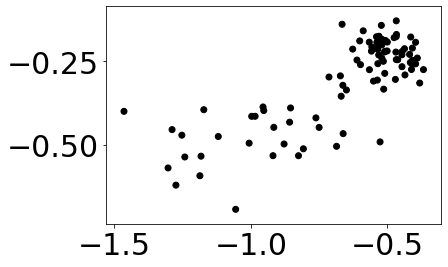

In [18]:
i = 1
j = 1
cln = np.where(nobloopr13[nbages[j]][elems[i]]>-100)
plt.scatter(nobloopr13[nbages[j]][cln]['FE_H'],nobloopr13[nbages[j]][cln][elems[i]],
            c=nobloopr13[nbages[j]][cln]['FE_H'],vmin=col_min,vmax=col_max,cmap=cm)

(array([224., 239., 228., 217., 174., 118.,  67.,  26.,   9.,   3.]),
 array([100.034 , 110.2065, 120.379 , 130.5515, 140.724 , 150.8965,
        161.069 , 171.2415, 181.414 , 191.5865, 201.759 ], dtype=float32),
 <a list of 10 Patch objects>)

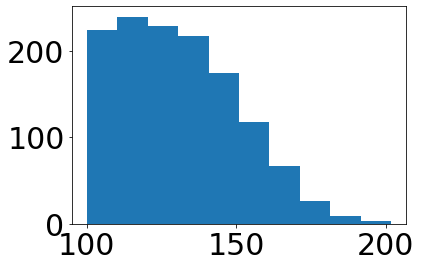

In [14]:
# print(np.median(nobloopr13['ALPHA_M']+nobloopr13['FE_H']))
# print(util.mad(nobloopr13['ALPHA_M']+nobloopr13['FE_H']))

col_max
col_min

plt.hist(nobloopr13['SNR'])

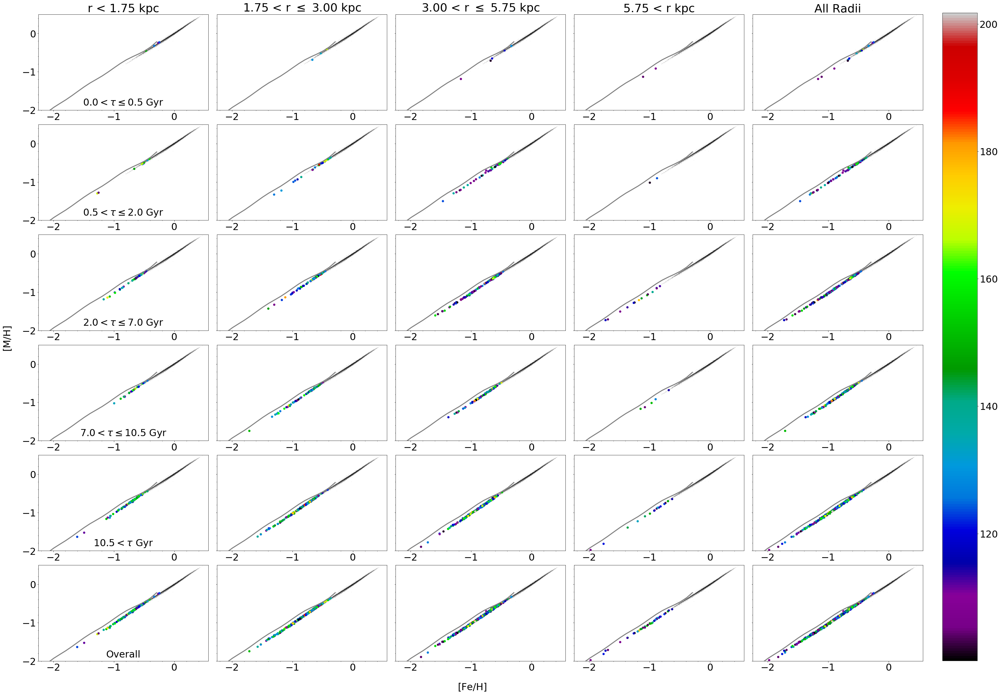

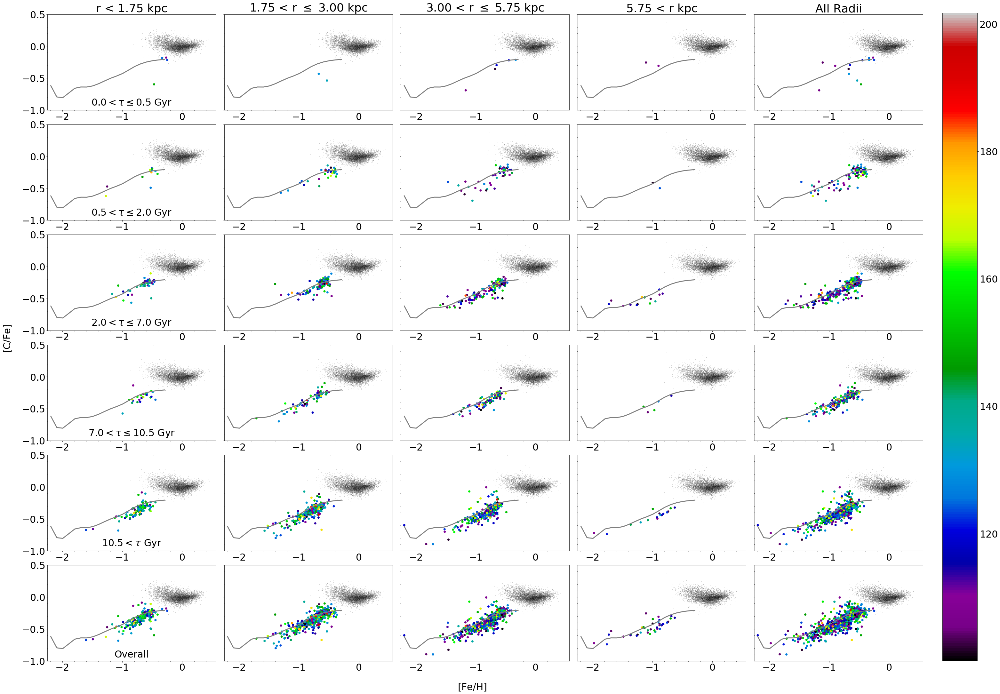

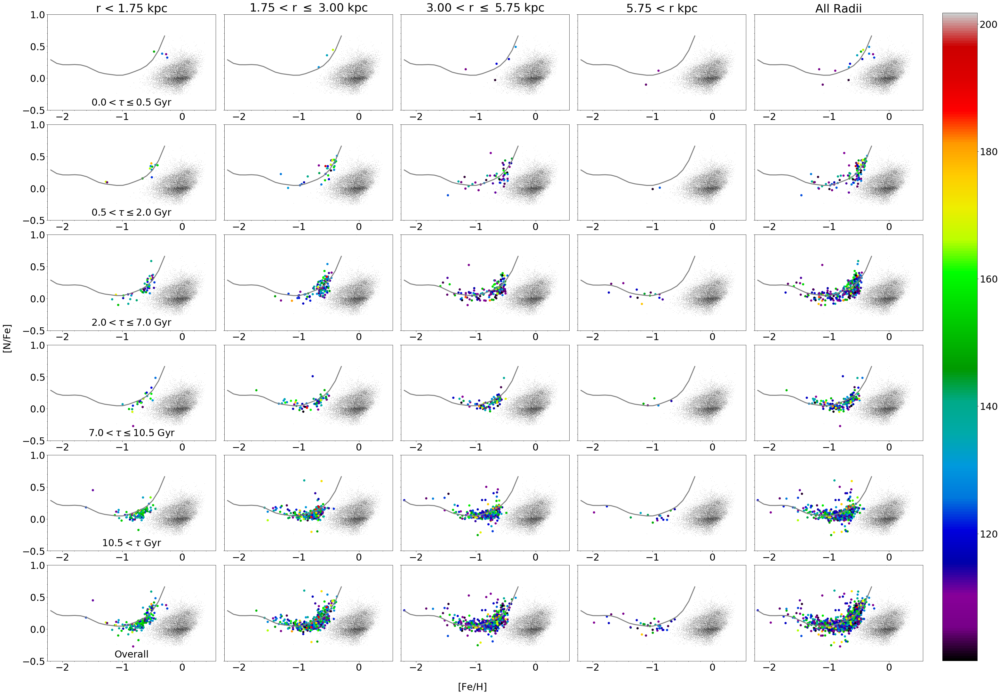

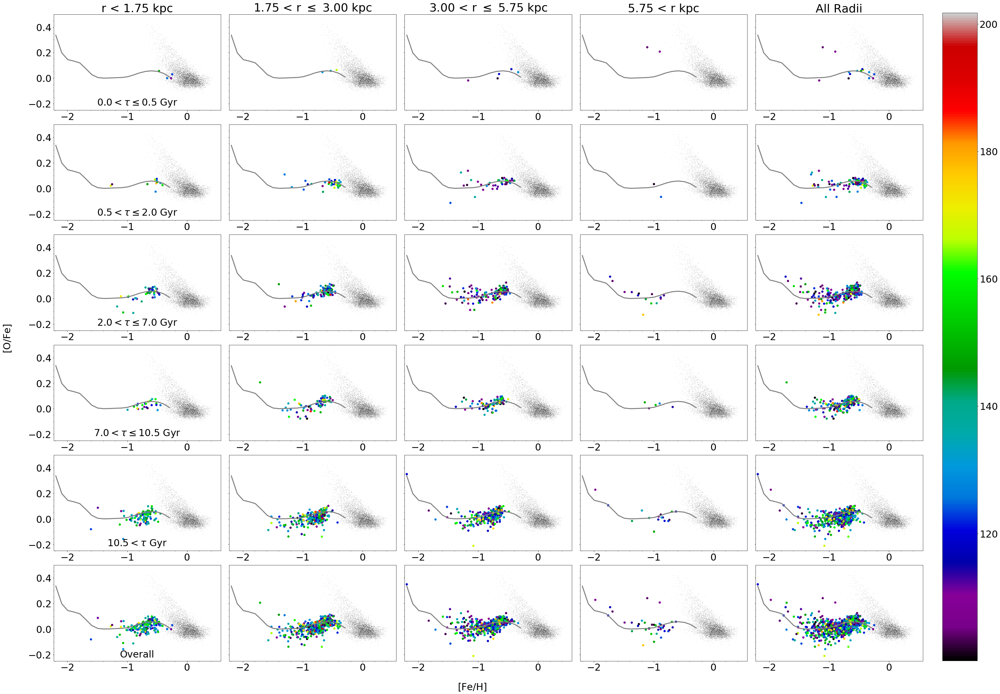

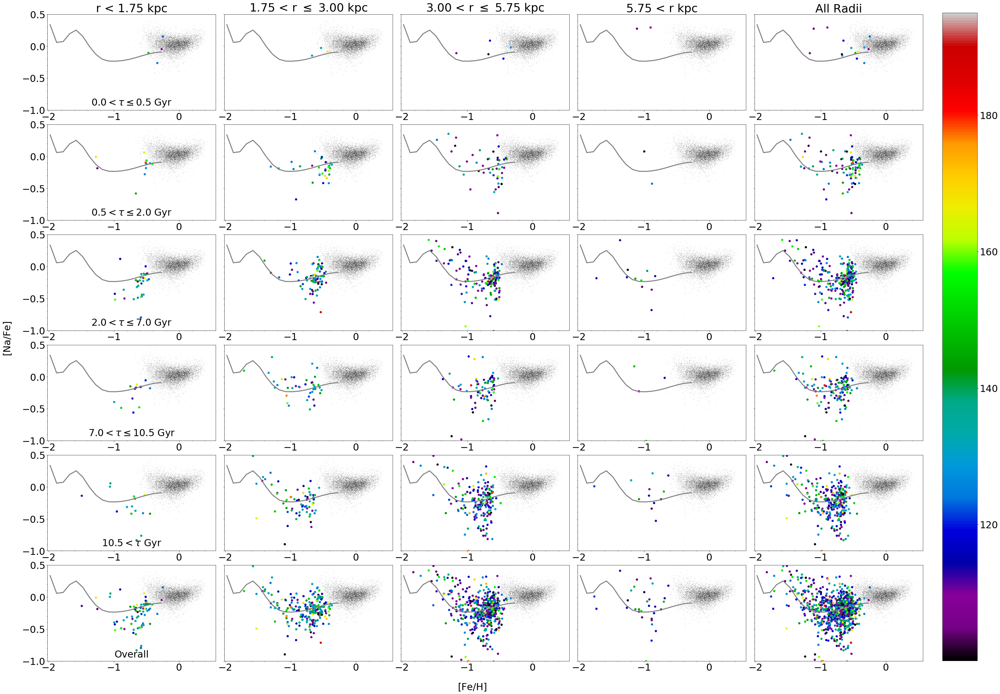

...

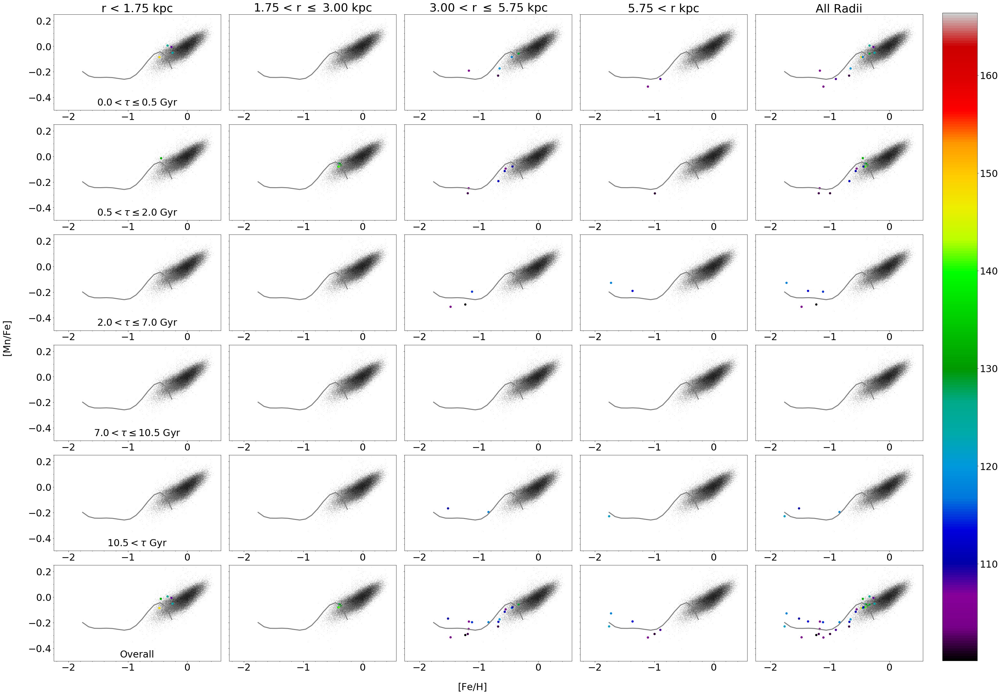

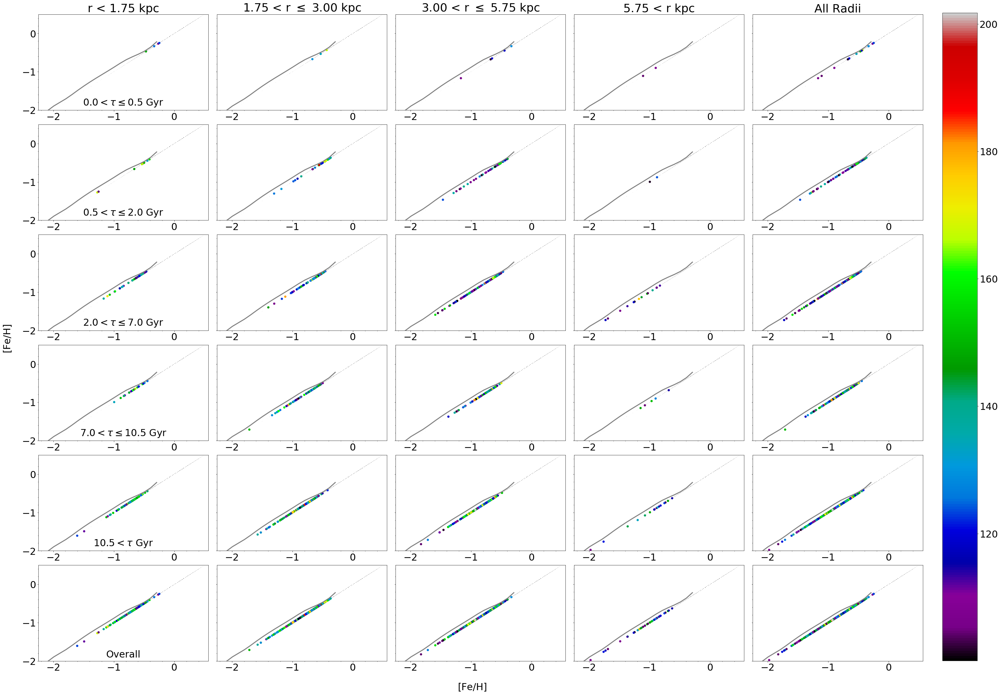

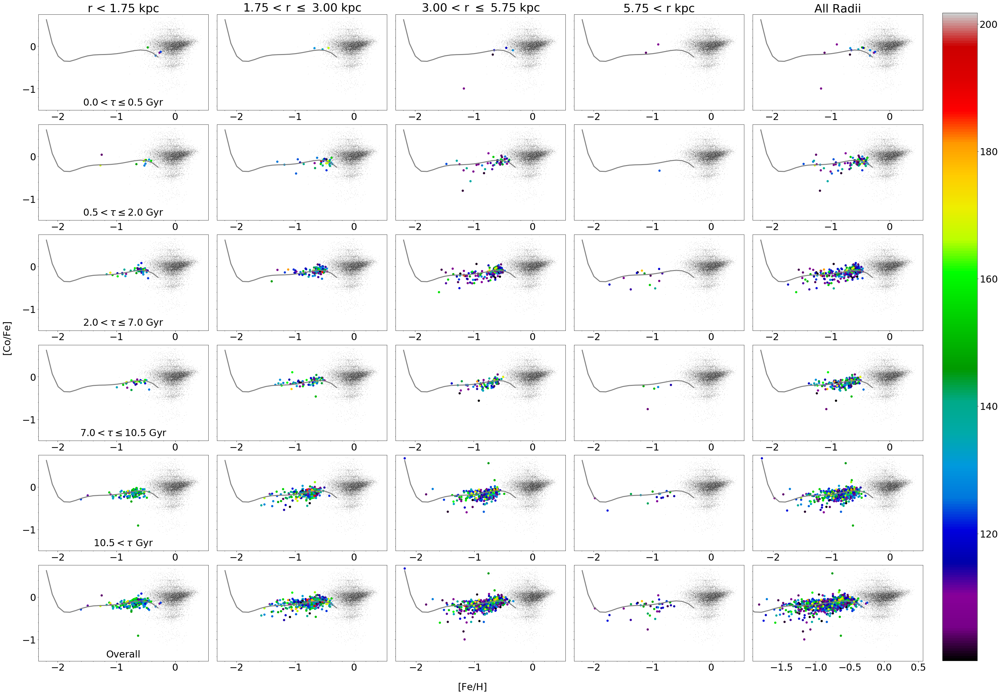

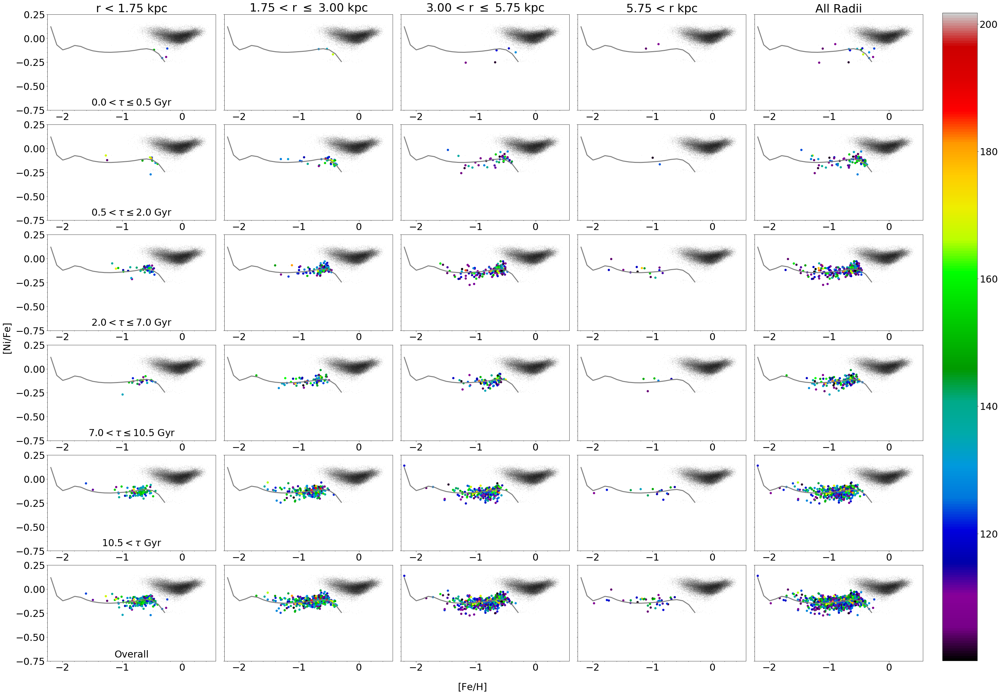

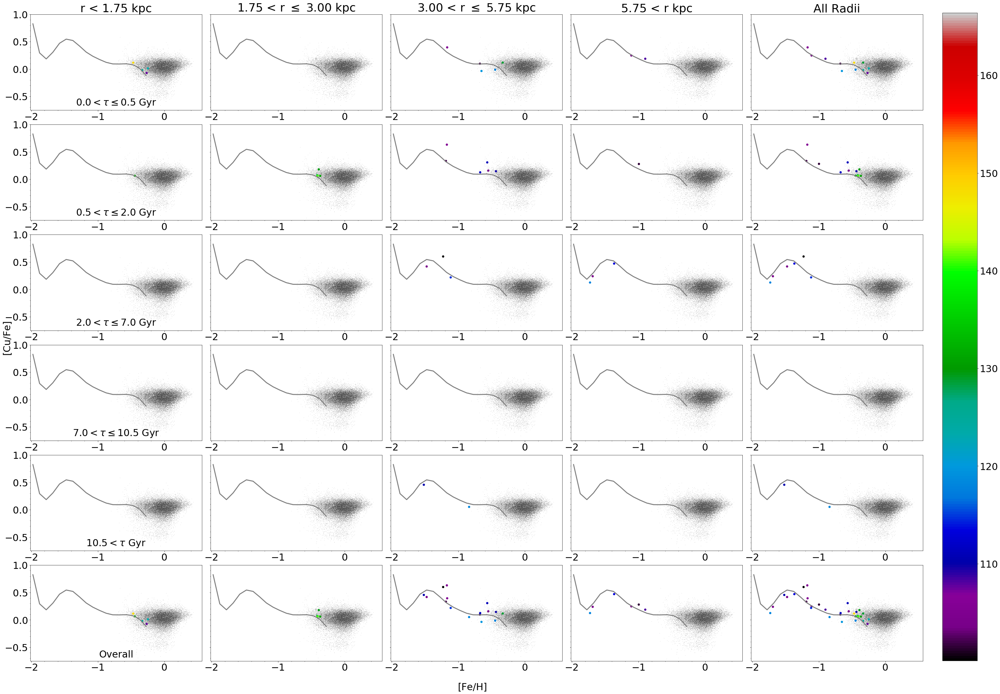

In [22]:
matplotlib.rcParams.update({'font.size': 30})
# from matplotlib.ticker import MultipleLocator

bottoms = [-2.0,-1.0,-0.5,-0.25,-1.0,-0.25,-0.8,-0.25,-0.5,-0.75,-0.5,-0.25,-0.5,-0.75,-1.0,-1.0,-0.5,-2.0,
           -1.5,-0.75,-0.75]
tops = [0.5,0.5,1.0,0.5,0.5,0.5,0.5,0.25,0.5,0.75,1.0,0.5,0.5,0.75,0.5,0.5,0.25,0.5,0.75,0.25,1.0]

for i in tqdm_notebook(range(len(elems)-5),desc='Hayden Plots Progress',leave=False):
#     try:
    fig, ax = plt.subplots(6,5,sharey=True,figsize=[40,30])
        
        ### 
    col_cln = np.where(nobloopr13[elems[i]]>-100) 
    col_max = np.max(nobloopr13['SNR'][col_cln])
    col_min = np.min(nobloopr13['SNR'][col_cln])
    cm = 'nipy_spectral'
        
    for k in range(4):
        cln =  np.where(nobloopr13[elems[i]]>-100)
        x1 = nobloopr13['FE_H'][cln]    
        x2 = np.arange(np.nanmin(x1),np.nanmax(x1),0.1)
        ax[0,k].plot(x2,LMCcubspl[i](x2),c='tab:gray',lw=3)
#             ax[0,k].scatter(MWDataFeH[i],MWDataXFe[i],c='pink')
        ax[0,k].imshow(np.log10(MWDataStat[i]).T, origin='lower',
                           extent=[MWDataXEdg[i][0],MWDataXEdg[i][-1],MWDataYEdg[i][0],MWDataYEdg[i][-1]],
                           aspect='auto', interpolation='nearest', cmap='binary')
        ax[0,k].set_ylim(bottoms[i],tops[i])
                
    for k in range(4):
        cln = np.where(nobloopr13[elems[i]][nbyoradius[k]]>-100)
        ax[0,k].scatter(nobloopr13['FE_H'][nbyoradius[k]][cln],
                            nobloopr13[elems[i]][nbyoradius[k]][cln],
                            c=nobloopr13['SNR'][nbyoradius[k]][cln],vmin=col_min,vmax=col_max,cmap=cm)
        ax[0,k].minorticks_on()

    for k in range(4):
        cln =  np.where(nobloopr13[elems[i]]>-100)
        x1 = nobloopr13['FE_H'][cln] 
        x2 = np.arange(np.nanmin(x1),np.nanmax(x1),0.1)
        ax[1,k].plot(x2,LMCcubspl[i](x2),c='tab:gray',lw=3)
#             ax[1,k].scatter(MWDataFeH[i],MWDataXFe[i],c='pink')
        ax[1,k].imshow(np.log10(MWDataStat[i]).T, origin='lower',
                           extent=[MWDataXEdg[i][0],MWDataXEdg[i][-1],MWDataYEdg[i][0],MWDataYEdg[i][-1]],
                           aspect='auto', interpolation='nearest', cmap='binary')
        ax[1,k].set_ylim(bottoms[i],tops[i])
                
    for k in range(4):
        cln = np.where(nobloopr13[elems[i]][nbylradius[k]]>-100)
        ax[1,k].scatter(nobloopr13['FE_H'][nbylradius[k]][cln],
                            nobloopr13[elems[i]][nbylradius[k]][cln],
                            c=nobloopr13['SNR'][nbylradius[k]][cln],vmin=col_min,vmax=col_max,cmap=cm)
        ax[1,k].minorticks_on()

    for k in range(4):
        cln =  np.where(nobloopr13[elems[i]]>-100)                
        x1 = nobloopr13['FE_H'][cln]
        x2 = np.arange(np.nanmin(x1),np.nanmax(x1),0.1)
        ax[2,k].plot(x2,LMCcubspl[i](x2),c='tab:gray',lw=3)
#             ax[2,k].scatter(MWDataFeH[i],MWDataXFe[i],c='pink')
        ax[2,k].imshow(np.log10(MWDataStat[i]).T, origin='lower',
                           extent=[MWDataXEdg[i][0],MWDataXEdg[i][-1],MWDataYEdg[i][0],MWDataYEdg[i][-1]],
                           aspect='auto', interpolation='nearest', cmap='binary')
        ax[2,k].set_ylim(bottoms[i],tops[i])
                
    for k in range(4):
        cln = np.where(nobloopr13[elems[i]][nbymradius[k]]>-100)
        ax[2,k].scatter(nobloopr13['FE_H'][nbymradius[k]][cln],
                            nobloopr13[elems[i]][nbymradius[k]][cln],
                            c=nobloopr13['SNR'][nbymradius[k]][cln],vmin=col_min,vmax=col_max,cmap=cm)
        ax[2,k].minorticks_on()

    for k in range(4):
        cln =  np.where(nobloopr13[elems[i]]>-100)
        x1 = nobloopr13['FE_H'][cln]
        x2 = np.arange(np.nanmin(x1),np.nanmax(x1),0.1)
        ax[3,k].plot(x2,LMCcubspl[i](x2),c='tab:gray',lw=3)
#             ax[3,k].scatter(MWDataFeH[i],MWDataXFe[i],c='pink')
        ax[3,k].imshow(np.log10(MWDataStat[i]).T, origin='lower',
                           extent=[MWDataXEdg[i][0],MWDataXEdg[i][-1],MWDataYEdg[i][0],MWDataYEdg[i][-1]],
                           aspect='auto', interpolation='nearest', cmap='binary')
        ax[3,k].set_ylim(bottoms[i],tops[i])
                
    for k in range(4):
        cln = np.where(nobloopr13[elems[i]][nbomradius[k]]>-100)
        ax[3,k].scatter(nobloopr13['FE_H'][nbomradius[k]][cln],
                            nobloopr13[elems[i]][nbomradius[k]][cln],
                            c=nobloopr13['SNR'][nbomradius[k]][cln],vmin=col_min,vmax=col_max,cmap=cm)
        ax[3,k].minorticks_on()

    for k in range(4):
        cln =  np.where(nobloopr13[elems[i]]>-100)
        x1 = nobloopr13['FE_H'][cln]
        x2 = np.arange(np.nanmin(x1),np.nanmax(x1),0.1)
        ax[4,k].plot(x2,LMCcubspl[i](x2),c='tab:gray',lw=3)
#             ax[4,k].scatter(MWDataFeH[i],MWDataXFe[i],c='pink')
        ax[4,k].imshow(np.log10(MWDataStat[i]).T, origin='lower',
                           extent=[MWDataXEdg[i][0],MWDataXEdg[i][-1],MWDataYEdg[i][0],MWDataYEdg[i][-1]],
                           aspect='auto', interpolation='nearest', cmap='binary')
        ax[4,k].set_ylim(bottoms[i],tops[i])
                
    for k in range(4):
        cln = np.where(nobloopr13[elems[i]][nbolradius[k]]>-100)
        ax[4,k].scatter(nobloopr13['FE_H'][nbolradius[k]][cln],
                            nobloopr13[elems[i]][nbolradius[k]][cln],
                            c=nobloopr13['SNR'][nbolradius[k]][cln],vmin=col_min,vmax=col_max,cmap=cm)
        ax[4,k].minorticks_on()

    for k in range(4):
        cln = np.where(nobloopr13[elems[i]]>-100)
        x1 = nobloopr13['FE_H'][cln]
        x2 = np.arange(np.nanmin(x1),np.nanmax(x1),0.1)
        ax[5,k].plot(x2,LMCcubspl[i](x2),c='tab:gray',lw=3)
#             ax[5,k].scatter(MWDataFeH[i],MWDataXFe[i],c='pink')
        ax[5,k].imshow(np.log10(MWDataStat[i]).T, origin='lower',
                           extent=[MWDataXEdg[i][0],MWDataXEdg[i][-1],MWDataYEdg[i][0],MWDataYEdg[i][-1]],
                           aspect='auto', interpolation='nearest', cmap='binary')
        ax[5,k].set_ylim(bottoms[i],tops[i])
                    
    for k in range(4):
        cln = np.where(nobloopr13[elems[i]][nbrad_bins[k]]>-100)
        ax[5,k].scatter(nobloopr13['FE_H'][nbrad_bins[k]][cln],
                            nobloopr13[elems[i]][nbrad_bins[k]][cln],
                            c=nobloopr13['SNR'][nbrad_bins[k]][cln],vmin=col_min,vmax=col_max,cmap=cm)
        ax[5,k].minorticks_on()
                    
    for j in range(5):
        cln = np.where(nobloopr13[elems[i]]>-100)
        x1 = nobloopr13['FE_H'][cln]    
        x2 = np.arange(np.nanmin(x1),np.nanmax(x1),0.1)
        ax[j,4].plot(x2,LMCcubspl[i](x2),c='tab:gray',lw=3)
#             ax[j,4].scatter(MWDataFeH[i],MWDataXFe[i],c='pink')
        ax[j,4].imshow(np.log10(MWDataStat[i]).T, origin='lower',
                           extent=[MWDataXEdg[i][0],MWDataXEdg[i][-1],MWDataYEdg[i][0],MWDataYEdg[i][-1]],
                           aspect='auto', interpolation='nearest', cmap='binary')
        ax[j,4].set_ylim(bottoms[i],tops[i])
            
    for j in range(5):
        cln = np.where(nobloopr13[nbages[j]][elems[i]]>-100)
        im = ax[j,4].scatter(nobloopr13[nbages[j]][cln]['FE_H'],
                            nobloopr13[nbages[j]][cln][elems[i]],
                            c=nobloopr13[nbages[j]][cln]['SNR'],vmin=col_min,vmax=col_max,cmap=cm)
        ax[j,4].minorticks_on()


        # bottom corner total
    cln = np.where(nobloopr13[elems[i]]>-100)
    x1 = nobloopr13['FE_H'][cln]
    x2 = np.arange(np.nanmin(x1),np.nanmax(x1),0.1)
    im = ax[5,4].scatter(nobloopr13['FE_H'][cln],nobloopr13[elems[i]][cln],c=nobloopr13['SNR'][cln],
                        cmap='nipy_spectral')
    ax[5,4].plot(x2,LMCcubspl[i](x2),c='tab:gray',lw=3)
#         ax[5,4].scatter(MWDataFeH[i],MWDataXFe[i],c='pink')
    ax[5,4].imshow(np.log10(MWDataStat[i]).T, origin='lower',
                           extent=[MWDataXEdg[i][0],MWDataXEdg[i][-1],MWDataYEdg[i][0],MWDataYEdg[i][-1]],
                           aspect='auto', interpolation='nearest', cmap='binary')
    ax[5,4].set_ylim(bottoms[i],tops[i])

    rad_labels = ['r < 1.75 kpc','1.75 < r $\leq$ 3.00 kpc','3.00 < r $\leq$ 5.75 kpc','5.75 < r kpc',
                      'All Radii']
    for m in range(5):
        ax[0,m].set_title(r'{}'.format(rad_labels[m]))
    
    age_labels = ['$0.0 < \\tau \leq 0.5$ Gyr','$0.5 < \\tau \leq 2.0$ Gyr','$2.0 < \\tau \leq 7.0$ Gyr',
              '$7.0 < \\tau \leq 10.5$ Gyr','$10.5 < \\tau$ Gyr','Overall']  
    for n in range(5):
        ax[n,0].set_xlabel('{}'.format(age_labels[n]),labelpad=-75.0)
        
    ax[5,0].set_xlabel('{}'.format(age_labels[-1]),labelpad=-70.0)
    
    fig.text(0.5, -0.01, '[Fe/H]', ha='center')
    fig.text(-0.01, 0.5, '{}'.format(labs[i]), va='center', rotation='vertical')
    fig.colorbar(im,ax=ax[:,4],cax=fig.add_axes([1.01, 0.032, 0.038, 0.9377]))
    plt.tight_layout()
    fig.subplots_adjust(wspace=0.05, hspace=0.15)
    plt.savefig('haydenbloopcut_fid{}'.format(elems[i]),bbox_inches='tight')
    plt.show()
        
#     except:
#         print(r'nope')
#         pass

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7fac683d6dd0>,
      dtype=object)

In [ ]:
# for i in range(len(elems)-5):
#     for j in range(len(nbages)):
#         cln = np.where((nobloopr13[nbages[j]][elems[i]]>-100)&(nobloopr13[nbages[j]]['SNR']>100))
#         plt.scatter(nobloopr13['FE_H'][nbages[j]][cln],nobloopr13[nbages[j]][elems[i]][cln],c='{}'.format(col[0]))
#         plt.title(r'{}'.format(labs[i]))
#         plt.show()

In [ ]:
# from scipy.interpolate import CubicSpline

# for i in tqdm_notebook(range(len(elems)-5),desc='Hayden Plots Progress',leave=False):
#     try:
#         fig, ax = plt.subplots(6,4,sharex=True,sharey=True,figsize=[20,20])
#         for j in range(6):
#             if j == 0:
#                 for k in range(4):
#                     cln =  np.where(nobloopr13[elems[i]][nbrad_bins[k]]>-100)
                
#                     x1 = nobloopr13['FE_H'][nbrad_bins[k]][cln]
#                     y1 = (nobloopr13[elems[i]])[nbrad_bins[k]][cln]
                
#                     bins_fe = np.arange(np.floor(np.min(x1)),np.ceil(np.max(x1)),0.2)
#                     bin_xfe, _, _ = binned_statistic(x1,y1,statistic='median',bins=bins_fe)
#                     fin = np.where(np.isfinite(bin_xfe)==True)
#                     cs = CubicSpline(bins_fe[:-1][fin],bin_xfe[fin])
                
#                     x2 = np.arange(np.nanmin(x1),np.nanmax(x1),0.1)
#                     ax[j,k].plot(x2,cs(x2),c='tab:gray',lw=3)
                
#                 for k in range(4):
#                     cln = np.where(nobloopr13[elems[i]][nbyoradius[k]]>-100)
#                     ax[j,k].scatter(nobloopr13['FE_H'][nbyoradius[k]][cln],(nobloopr13[elems[i]])[nbyoradius[k]][cln],
#                                 c='purple')

#             if j == 1:
#                 for k in range(4):
#                     cln =  np.where(nobloopr13[elems[i]][nbrad_bins[k]]>-100)
                
#                     x1 = nobloopr13['FE_H'][nbrad_bins[k]][cln]
#                     y1 = (nobloopr13[elems[i]])[nbrad_bins[k]][cln]
                
#                     bins_fe = np.arange(np.floor(np.min(x1)),np.ceil(np.max(x1)),0.2)
#                     bin_xfe, _, _ = binned_statistic(x1,y1,statistic='median',bins=bins_fe)
#                     fin = np.where(np.isfinite(bin_xfe)==True)
#                     cs = CubicSpline(bins_fe[:-1][fin],bin_xfe[fin])
                
#                     x2 = np.arange(np.nanmin(x1),np.nanmax(x1),0.1)
#                     ax[j,k].plot(x2,cs(x2),c='tab:gray',lw=3)
                
#                 for k in range(4):
#                     cln = np.where(nobloopr13[elems[i]][nbylradius[k]]>-100)
#                     ax[j,k].scatter(nobloopr13['FE_H'][nbylradius[k]][cln],(nobloopr13[elems[i]])[nbylradius[k]][cln],
#                                 c='blue')

#             if j == 2:
#                 for k in range(4):
#                     cln =  np.where(nobloopr13[elems[i]][nbrad_bins[k]]>-100)
                
#                     x1 = nobloopr13['FE_H'][nbrad_bins[k]][cln]
#                     y1 = (nobloopr13[elems[i]])[nbrad_bins[k]][cln]
                
#                     bins_fe = np.arange(np.floor(np.min(x1)),np.ceil(np.max(x1)),0.2)
#                     bin_xfe, _, _ = binned_statistic(x1,y1,statistic='median',bins=bins_fe)
#                     fin = np.where(np.isfinite(bin_xfe)==True)
#                     cs = CubicSpline(bins_fe[:-1][fin],bin_xfe[fin])
                
#                     x2 = np.arange(np.nanmin(x1),np.nanmax(x1),0.1)
#                     ax[j,k].plot(x2,cs(x2),c='tab:gray',lw=3)
                
#                 for k in range(4):
#                     cln = np.where(nobloopr13[elems[i]][nbymradius[k]]>-100)
#                     ax[j,k].scatter(nobloopr13['FE_H'][nbymradius[k]][cln],(nobloopr13[elems[i]])[nbymradius[k]][cln],
#                                 c='green')

#             if j == 3:
#                 for k in range(4):
#                     cln =  np.where(nobloopr13[elems[i]][nbrad_bins[k]]>-100)
                
#                     x1 = nobloopr13['FE_H'][nbrad_bins[k]][cln]
#                     y1 = (nobloopr13[elems[i]])[nbrad_bins[k]][cln]
                
#                     bins_fe = np.arange(np.floor(np.min(x1)),np.ceil(np.max(x1)),0.2)
#                     bin_xfe, _, _ = binned_statistic(x1,y1,statistic='median',bins=bins_fe)
#                     fin = np.where(np.isfinite(bin_xfe)==True)
#                     cs = CubicSpline(bins_fe[:-1][fin],bin_xfe[fin])
                
#                     x2 = np.arange(np.nanmin(x1),np.nanmax(x1),0.1)
#                     ax[j,k].plot(x2,cs(x2),c='tab:gray',lw=3)
                
#                 for k in range(4):
#                     cln = np.where(nobloopr13[elems[i]][nbomradius[k]]>-100)
#                     ax[j,k].scatter(nobloopr13['FE_H'][nbomradius[k]][cln],(nobloopr13[elems[i]])[nbomradius[k]][cln],
#                                 c='orange')

#             if j == 4:
#                 for k in range(4):
#                     cln =  np.where(nobloopr13[elems[i]][nbrad_bins[k]]>-100)
                
#                     x1 = nobloopr13['FE_H'][nbrad_bins[k]][cln]
#                     y1 = (nobloopr13[elems[i]])[nbrad_bins[k]][cln]
                
#                     bins_fe = np.arange(np.floor(np.min(x1)),np.ceil(np.max(x1)),0.2)
#                     bin_xfe, _, _ = binned_statistic(x1,y1,statistic='median',bins=bins_fe)
#                     fin = np.where(np.isfinite(bin_xfe)==True)
#                     cs = CubicSpline(bins_fe[:-1][fin],bin_xfe[fin])
                
#                     x2 = np.arange(np.nanmin(x1),np.nanmax(x1),0.1)
#                     ax[j,k].plot(x2,cs(x2),c='tab:gray',lw=3)
                
#                 for k in range(4):
#                     cln = np.where(nobloopr13[elems[i]][nbolradius[k]]>-100)
#                     ax[j,k].scatter(nobloopr13['FE_H'][nbolradius[k]][cln],(nobloopr13[elems[i]])[nbolradius[k]][cln],
#                                 c='red')

#             if j == 5:
#                 for k in range(4):
#                     cln =  np.where(nobloopr13[elems[i]][nbrad_bins[k]]>-100)
                
#                     x1 = nobloopr13['FE_H'][nbrad_bins[k]][cln]
#                     y1 = (nobloopr13[elems[i]])[nbrad_bins[k]][cln]
                
#                     bins_fe = np.arange(np.floor(np.min(x1)),np.ceil(np.max(x1)),0.2)
#                     bin_xfe, _, _ = binned_statistic(x1,y1,statistic='median',bins=bins_fe)
#                     fin = np.where(np.isfinite(bin_xfe)==True)
#                     cs = CubicSpline(bins_fe[:-1][fin],bin_xfe[fin])
                
#                     x2 = np.arange(np.nanmin(x1),np.nanmax(x1),0.1)
#                     ax[j,k].plot(x2,cs(x2),c='tab:gray',lw=3)   
#                     ax[j,k].scatter(x1,y1,c='k')

#         rad_labels = ['r < 1.75 kpc','1.75 < r $\leq$ 3.00 kpc','3.00 < r $\leq$ 5.75 kpc','5.75 < r kpc']
#         for l in range(4):
#             ax[0,l].set_title(r'{}'.format(rad_labels[l]))
    
#         age_labels = ['$0.0 < \\tau \leq 0.5$ Gyr','$0.5 < \\tau \leq 2.0$ Gyr','$2.0 < \\tau \leq 7.0$ Gyr',
#               '$7.0 < \\tau \leq 10.5$ Gyr','$10.5 < \\tau$ Gyr','Overall']  
#         for m in range(5):
#             ax[m,0].set_xlabel('{}'.format(age_labels[m]),labelpad=-20.0)
        
#         ax[5,0].set_xlabel('{}'.format(age_labels[-1]),labelpad=-45.0)
    
#         fig.text(0.5, -0.01, '[Fe/H]', ha='center')
#         fig.text(-0.01, 0.5, '{}'.format(labs[i]), va='center', rotation='vertical')
    
#         plt.tight_layout()
#         plt.savefig('haydenbloopcut_{}'.format(elems[i]),bbox_inches='tight')
#         plt.show()
        
#     except:
#         pass

<!-- <font size='15'>
    <b>
        Hayden Plot overall Fiducial no binning
    </b>
</font> -->

In [ ]:
# for i in tqdm_notebook(range(len(elems)-5),desc='Hayden Plots Progress',leave=False):
#     try:
#         fig, ax = plt.subplots(6,4,sharex=True,sharey=True,figsize=[20,20])
#         for j in range(6):
#             if j == 0:
#                 for k in range(4):
#                     cln =  np.where(nobloopr13[elems[i]]>-100)
                
#                     x1 = nobloopr13['FE_H'][cln]
#                     y1 = nobloopr13[elems[i]][cln]
                
#                     bins_fe = np.arange(np.floor(np.min(x1)),np.ceil(np.max(x1)),0.2)
#                     bin_xfe, _, _ = binned_statistic(x1,y1,statistic='median',bins=bins_fe)
#                     fin = np.where(np.isfinite(bin_xfe)==True)
#                     cs = CubicSpline(bins_fe[:-1][fin],bin_xfe[fin])
                
#                     x2 = np.arange(np.nanmin(x1),np.nanmax(x1),0.1)
#                     ax[j,k].plot(x2,cs(x2),c='tab:gray',lw=3)
                
#                 for k in range(4):
#                     cln = np.where(nobloopr13[elems[i]][nbyoradius[k]]>-100)
#                     ax[j,k].scatter(nobloopr13['FE_H'][nbyoradius[k]][cln],
#                                     nobloopr13[elems[i]][nbyoradius[k]][cln],
#                                 c='purple')

#             if j == 1:
#                 for k in range(4):
#                     cln =  np.where(nobloopr13[elems[i]]>-100)
                
#                     x1 = nobloopr13['FE_H'][cln]
#                     y1 = nobloopr13[elems[i]][cln]
                
#                     bins_fe = np.arange(np.floor(np.min(x1)),np.ceil(np.max(x1)),0.2)
#                     bin_xfe, _, _ = binned_statistic(x1,y1,statistic='median',bins=bins_fe)
#                     fin = np.where(np.isfinite(bin_xfe)==True)
#                     cs = CubicSpline(bins_fe[:-1][fin],bin_xfe[fin])
                
#                     x2 = np.arange(np.nanmin(x1),np.nanmax(x1),0.1)
#                     ax[j,k].plot(x2,cs(x2),c='tab:gray',lw=3)
                
#                 for k in range(4):
#                     cln = np.where(nobloopr13[elems[i]][nbylradius[k]]>-100)
#                     ax[j,k].scatter(nobloopr13['FE_H'][nbylradius[k]][cln],
#                                     nobloopr13[elems[i]][nbylradius[k]][cln],
#                                 c='blue')

#             if j == 2:
#                 for k in range(4):
#                     cln =  np.where(nobloopr13[elems[i]]>-100)
                
#                     x1 = nobloopr13['FE_H'][cln]
#                     y1 = nobloopr13[elems[i]][cln]
                
#                     bins_fe = np.arange(np.floor(np.min(x1)),np.ceil(np.max(x1)),0.2)
#                     bin_xfe, _, _ = binned_statistic(x1,y1,statistic='median',bins=bins_fe)
#                     fin = np.where(np.isfinite(bin_xfe)==True)
#                     cs = CubicSpline(bins_fe[:-1][fin],bin_xfe[fin])
                
#                     x2 = np.arange(np.nanmin(x1),np.nanmax(x1),0.1)
#                     ax[j,k].plot(x2,cs(x2),c='tab:gray',lw=3)
                
#                 for k in range(4):
#                     cln = np.where(nobloopr13[elems[i]][nbymradius[k]]>-100)
#                     ax[j,k].scatter(nobloopr13['FE_H'][nbymradius[k]][cln],
#                                     nobloopr13[elems[i]][nbymradius[k]][cln],
#                                 c='green')

#             if j == 3:
#                 for k in range(4):
#                     cln =  np.where(nobloopr13[elems[i]]>-100)
                
#                     x1 = nobloopr13['FE_H'][cln]
#                     y1 = nobloopr13[elems[i]][cln]
                
#                     bins_fe = np.arange(np.floor(np.min(x1)),np.ceil(np.max(x1)),0.2)
#                     bin_xfe, _, _ = binned_statistic(x1,y1,statistic='median',bins=bins_fe)
#                     fin = np.where(np.isfinite(bin_xfe)==True)
#                     cs = CubicSpline(bins_fe[:-1][fin],bin_xfe[fin])
                
#                     x2 = np.arange(np.nanmin(x1),np.nanmax(x1),0.1)
#                     ax[j,k].plot(x2,cs(x2),c='tab:gray',lw=3)
                
#                 for k in range(4):
#                     cln = np.where(nobloopr13[elems[i]][nbomradius[k]]>-100)
#                     ax[j,k].scatter(nobloopr13['FE_H'][nbomradius[k]][cln],
#                                     nobloopr13[elems[i]][nbomradius[k]][cln],
#                                 c='orange')

#             if j == 4:
#                 for k in range(4):
#                     cln =  np.where(nobloopr13[elems[i]]>-100)
                
#                     x1 = nobloopr13['FE_H'][cln]
#                     y1 = nobloopr13[elems[i]][cln]
                
#                     bins_fe = np.arange(np.floor(np.min(x1)),np.ceil(np.max(x1)),0.2)
#                     bin_xfe, _, _ = binned_statistic(x1,y1,statistic='median',bins=bins_fe)
#                     fin = np.where(np.isfinite(bin_xfe)==True)
#                     cs = CubicSpline(bins_fe[:-1][fin],bin_xfe[fin])
                
#                     x2 = np.arange(np.nanmin(x1),np.nanmax(x1),0.1)
#                     ax[j,k].plot(x2,cs(x2),c='tab:gray',lw=3)
                
#                 for k in range(4):
#                     cln = np.where(nobloopr13[elems[i]][nbolradius[k]]>-100)
#                     ax[j,k].scatter(nobloopr13['FE_H'][nbolradius[k]][cln],
#                                     nobloopr13[elems[i]][nbolradius[k]][cln],
#                                 c='red')

#             if j == 5:
#                 for k in range(4):
#                     cln = np.where(nobloopr13[elems[i]]>-100)
#                     #np.where(nobloopr13[elems[i]][nbrad_bins[k]]>-100)
                
#                     x1 = nobloopr13['FE_H'][cln]
#                     y1 = nobloopr13[elems[i]][cln]
                
#                     bins_fe = np.arange(np.floor(np.min(x1)),np.ceil(np.max(x1)),0.2)
#                     bin_xfe, _, _ = binned_statistic(x1,y1,statistic='median',bins=bins_fe)
#                     fin = np.where(np.isfinite(bin_xfe)==True)
#                     cs = CubicSpline(bins_fe[:-1][fin],bin_xfe[fin])
                
#                     x2 = np.arange(np.nanmin(x1),np.nanmax(x1),0.1)
#                     ax[j,k].plot(x2,cs(x2),c='tab:gray',lw=3)   
# #                     ax[j,k].scatter(x1,y1,c='k')
                    
#                 for k in range(4):
#                     cln = np.where(nobloopr13[elems[i]][nbrad_bins[k]]>-100)
#                     ax[j,k].scatter(nobloopr13['FE_H'][nbrad_bins[k]][cln],
#                                     nobloopr13[elems[i]][nbrad_bins[k]][cln],c='k')
                    

#         rad_labels = ['r < 1.75 kpc','1.75 < r $\leq$ 3.00 kpc','3.00 < r $\leq$ 5.75 kpc','5.75 < r kpc']
#         for l in range(4):
#             ax[0,l].set_title(r'{}'.format(rad_labels[l]))
    
#         age_labels = ['$0.0 < \\tau \leq 0.5$ Gyr','$0.5 < \\tau \leq 2.0$ Gyr','$2.0 < \\tau \leq 7.0$ Gyr',
#               '$7.0 < \\tau \leq 10.5$ Gyr','$10.5 < \\tau$ Gyr','Overall']  
#         for m in range(5):
#             ax[m,0].set_xlabel('{}'.format(age_labels[m]),labelpad=-20.0)
        
#         ax[5,0].set_xlabel('{}'.format(age_labels[-1]),labelpad=-45.0)
    
#         fig.text(0.5, -0.01, '[Fe/H]', ha='center')
#         fig.text(-0.01, 0.5, '{}'.format(labs[i]), va='center', rotation='vertical')
    
#         plt.tight_layout()
#         plt.savefig('haydenbloopcut_fid{}'.format(elems[i]),bbox_inches='tight')
#         plt.show()
        
#     except:
#         pass

<font size='15' color='red'>
    <b>
        You Should Really Stop And Not Continue After This
    </b>
</font>

In [ ]:
over_medians = []
for i in range(len(elems)-5):
    
    medians = []
    rad_bins = [one,two,three,four]
    for k in range(4):
        
        cln = np.where(r13[elems[i]][rad_bins[k]]>-100)
        med = np.median([r13['FE_H'][rad_bins[k]][cln],r13[elems[i]][rad_bins[k]][cln]],axis=1)
        medians.append(med)
    
    over_medians.append(medians)
    

colors = [1,2,3,4]
plt.figure(figsize=[6,4])
for j in range(len(elems)-5):
    for k in range(4):
        plt.scatter(over_medians[j][k][0],over_medians[j][k][1])
        
    
    plt.xlim(-1.0,-0.25)
    plt.ylabel(r'{}'.format(labs[j]))
    plt.show()

In [ ]:
ironpeak = [np.where(elems=='FE_H'),np.where(elems=='CR_FE'),np.where(elems=='CO_FE'),np.where(elems == 'NI_FE')]
alphaelm = [np.where(elems=='O_FE'),np.where(elems=='MG_FE'),np.where(elems=='SI_FE'),np.where(elems == 'CA_FE')]
oddzelem = [np.where(elems=='NA_FE'),np.where(elems == 'AL_FE')]

median_xvals = []
median_yvals = []

for i in range(len(over_medians)):
    xpt = []
    ypt = []
    for j in range(4):
        xpt.append(over_medians[i][j][0])
        ypt.append(over_medians[i][j][1])
    median_xvals.append([xpt[0],xpt[1],xpt[2],xpt[3]])
    median_yvals.append([ypt[0],ypt[1],ypt[2],ypt[3]])

x_irons = []
y_irons = []
for k in np.squeeze(ironpeak):
    x_irons.append(median_xvals[k])
    y_irons.append(median_yvals[k])
    
x_alpha = []
y_alpha = []
for k in np.squeeze(alphaelm):
    x_alpha.append(median_xvals[k])
    y_alpha.append(median_yvals[k])

x_oddzs = []
y_oddzs = []
for k in np.squeeze(ironpeak):
    x_oddzs.append(median_xvals[k])
    y_oddzs.append(median_yvals[k])
    

### Hayden plot median trends   
plt.figure(figsize=[10,5])
# plt.plot(x_irons[0],y_irons[0],label='[Fe/H]')
plt.plot(x_irons[1],y_irons[1],label='[Cr/Fe]')
plt.plot(x_irons[2],y_irons[2],label='[Co/Fe]')
plt.plot(x_irons[3],y_irons[3],label='[Ni/FE]')
plt.title(r'Iron Peak Elements')
plt.xlabel(r'[Fe/H]')
plt.ylabel(r'[X/Fe]')
plt.legend()
plt.show()

plt.figure(figsize=[10,5])
plt.plot(x_alpha[0],y_alpha[0],label='[O/Fe]')
plt.plot(x_alpha[1],y_alpha[1],label='[Mg/Fe]')
plt.plot(x_alpha[2],y_alpha[2],label='[Si/Fe]')
plt.plot(x_alpha[3],y_alpha[3],label='[Ca/FE]')
plt.title(r'$\alpha$ Elements')
plt.xlabel(r'[Fe/H]')
plt.ylabel(r'[X/Fe]')
plt.legend()
plt.show()

plt.figure(figsize=[10,5])
plt.plot(x_oddzs[0],y_oddzs[0],label='[Na/Fe]')
plt.plot(x_oddzs[1],y_oddzs[1],label='[Al/Fe]')
plt.title(r'Odd Z')
plt.xlabel(r'[Fe/H]')
plt.ylabel(r'[X/Fe]')
plt.legend()
plt.show()

<font size='15' color='#FF0000'>
    <b>
        ##### You Can Stop Right Here #####
    </b>
</font>

<font size='15'>
    <b>
        Equal Number of Stars Binning
    </b>
</font>

In [ ]:
##############
###  Bins  ###
##############

oneb = np.where(radius<2.375)
twob = np.where((radius>=2.375)&(radius<3.902))
threeb = np.where((radius>=3.902)&(radius<4.764))
fourb = np.where(radius>=4.764)

rad_binsb = [oneb,twob,threeb,fourb]

## yoradiusb
yooneb = np.where((ages['AGE']<=np.log10(0.5*10**9))&(radius<2.375))
yotwob = np.where((ages['AGE']<=np.log10(0.5*10**9))&(radius>=2.375)&(radius<3.902))
yothreeb = np.where((ages['AGE']<=np.log10(0.5*10**9))&(radius>=3.902)&(radius<4.764))
yofourb = np.where((ages['AGE']<=np.log10(0.5*10**9))&(radius>=4.764))

yoradiusb = [yooneb,yotwob,yothreeb,yofourb]

## ylradiusb
yloneb = np.where((ages['AGE']>np.log10(0.5*10**9))&(ages['AGE']<=np.log10(2.0*10**9))&(radius<2.375))
yltwob = np.where((ages['AGE']>np.log10(0.5*10**9))&(ages['AGE']<=np.log10(2.0*10**9))&(radius>=2.375)&(radius<3.902))
ylthreeb = np.where((ages['AGE']>np.log10(0.5*10**9))&(ages['AGE']<=np.log10(2.0*10**9))&
                   (radius>=3.902)&(radius<4.764))
ylfourb = np.where((ages['AGE']>np.log10(0.5*10**9))&(ages['AGE']<=np.log10(2.0*10**9))&(radius>=4.764))

ylradiusb = [yloneb,yltwob,ylthreeb,ylfourb]

## ymradiusb
ymoneb = np.where((ages['AGE']>np.log10(2.0*10**9))&(ages['AGE']<=np.log10(7*10**9))&(radius<2.375))
ymtwob = np.where((ages['AGE']>np.log10(2.0*10**9))&(ages['AGE']<=np.log10(7*10**9))&(radius>=2.375)&(radius<3.902))
ymthreeb = np.where((ages['AGE']>np.log10(2.0*10**9))&(ages['AGE']<=np.log10(7*10**9))&
                   (radius>=3.902)&(radius<4.764))
ymfourb = np.where((ages['AGE']>np.log10(2.0*10**9))&(ages['AGE']<=np.log10(7*10**9))&(radius>=4.764))

ymradiusb = [ymoneb,ymtwob,ymthreeb,ymfourb]

## omradiusb
omoneb = np.where((ages['AGE']>np.log10(7*10**9))&(ages['AGE']<=np.log10(10.5*10**9))&(radius<2.375))
omtwob = np.where((ages['AGE']>np.log10(7*10**9))&(ages['AGE']<=np.log10(10.5*10**9))&(radius>=2.375)&(radius<3.902))
omthreeb = np.where((ages['AGE']>np.log10(7*10**9))&(ages['AGE']<=np.log10(10.5*10**9))&
                   (radius>=3.902)&(radius<4.764))
omfourb = np.where((ages['AGE']>np.log10(7*10**9))&(ages['AGE']<=np.log10(10.5*10**9))&(radius>=4.764))

omradiusb = [omoneb,omtwob,omthreeb,omfourb]

## olradiusb
oloneb = np.where((ages['AGE']>np.log10(10.5*10**9))&(radius<2.375))
oltwob = np.where((ages['AGE']>np.log10(10.5*10**9))&(radius>=1.75)&(radius<3.0))
olthreeb = np.where((ages['AGE']>np.log10(10.5*10**9))&(radius>=3.902)&(radius<4.764))
olfourb = np.where((ages['AGE']>np.log10(10.5*10**9))&(radius>=4.764))

olradiusb = [oloneb,oltwob,olthreeb,olfourb]

In [ ]:
for i in tqdm_notebook(range(len(elems)-5),desc='plots',leave=False):
    
    print(r'---------------{}---------------'.format(labs[i]))
    
    medians = []
    
    fig, ax = plt.subplots(1,4,sharey=True,figsize=[25,4])
    rad_binsb = [oneb,twob,threeb,fourb]
    rad_labelsb = ['r < 2.37 kpc','2.37 < r $\leq$ 3.90 kpc','3.90 < r $\leq$ 4.76 kpc','4.76 < r kpc']
    for k in range(4):
        
        cln = np.where(r13[elems[i]][rad_binsb[k]]>-100)
        hayden = binned_statistic_2d(r13['FE_H'][rad_binsb[k]][cln],r13[elems[i]][rad_binsb[k]][cln],
                                     r13['FE_H'][rad_binsb[k]][cln],statistic='count',bins=30)
        mask=hayden.statistic <= 0.
        hayden.statistic[mask] = np.nan
    
        im = ax[k].imshow(hayden.statistic.T, origin='lower',
                          extent=[hayden.x_edge[0],hayden.x_edge[-1],hayden.y_edge[0],hayden.y_edge[-1]],
                          aspect='auto', interpolation='nearest', cmap='terrain_r')
    
        ax[k].set_title(r'{}'.format(rad_labelsb[k]))
        ax[k].set_xlabel(r'[Fe/H]')
        ax[k].set_xlim(-2.5,0)
        ax[k].grid()
    
#         fig.colorbar(im, ax=ax.ravel().tolist())
    
        ax[0].set_ylabel(r'{}'.format(labs[i]))
        print(r'{}: '.format(rad_labelsb[k])
              ,np.median([r13['FE_H'][rad_binsb[k]][cln],r13[elems[i]][rad_binsb[k]][cln]],axis=1))
        
        med = np.median([r13['FE_H'][rad_binsb[k]][cln],r13[elems[i]][rad_binsb[k]][cln]],axis=1) 
        
        ax[k].scatter(med[0],med[1],c='k',marker='*',s=500)
    
    plt.show()

In [ ]:
over_mediansb = []
for i in range(len(elems)-5):
    
    medians = []
    rad_binsb = [oneb,twob,threeb,fourb]
    for k in range(4):
        
        cln = np.where(r13[elems[i]][rad_binsb[k]]>-100)
        med = np.median([r13['FE_H'][rad_binsb[k]][cln],r13[elems[i]][rad_binsb[k]][cln]],axis=1)
        medians.append(med)
    
    over_mediansb.append(medians)
    
colors = [1,2,3,4]
plt.figure(figsize=[6,4])
for j in range(len(elems)-5):
    for k in range(4):
        plt.scatter(over_mediansb[j][k][0],over_mediansb[j][k][1])
    
    plt.xlim(-1.0,-0.25)
    plt.ylabel(r'{}'.format(labs[j]))
    plt.show()

In [ ]:
ironpeak = [np.where(elems=='FE_H'),np.where(elems=='CR_FE'),np.where(elems=='CO_FE'),np.where(elems == 'NI_FE')]
alphaelm = [np.where(elems=='O_FE'),np.where(elems=='MG_FE'),np.where(elems=='SI_FE'),np.where(elems == 'CA_FE')]
oddzelem = [np.where(elems=='NA_FE'),np.where(elems == 'AL_FE')]

median_xvalsb = []
median_yvalsb = []

for i in range(len(over_mediansb)):
    xpt = []
    ypt = []
    for j in range(4):
        xpt.append(over_medians[i][j][0])
        ypt.append(over_medians[i][j][1])
    median_xvalsb.append([xpt[0],xpt[1],xpt[2],xpt[3]])
    median_yvalsb.append([ypt[0],ypt[1],ypt[2],ypt[3]])

x_ironsb = []
y_ironsb = []
for k in np.squeeze(ironpeak):
    x_ironsb.append(median_xvals[k])
    y_ironsb.append(median_yvals[k])
    
x_alphab = []
y_alphab = []
for k in np.squeeze(alphaelm):
    x_alphab.append(median_xvals[k])
    y_alphab.append(median_yvals[k])

x_oddzsb = []
y_oddzsb = []
for k in np.squeeze(ironpeak):
    x_oddzsb.append(median_xvals[k])
    y_oddzsb.append(median_yvals[k])
    

### Hayden plot median trends   
plt.figure(figsize=[10,5])
# plt.plot(x_irons[0],y_irons[0],label='[Fe/H]')
plt.plot(x_ironsb[1],y_ironsb[1],label='[Cr/Fe]')
plt.plot(x_ironsb[2],y_ironsb[2],label='[Co/Fe]')
plt.plot(x_ironsb[3],y_ironsb[3],label='[Ni/FE]')
plt.title(r'Iron Peak Elements')
plt.xlabel(r'[Fe/H]')
plt.ylabel(r'[X/Fe]')
plt.legend()
plt.show()

plt.figure(figsize=[10,5])
plt.plot(x_alphab[0],y_alphab[0],label='[O/Fe]')
plt.plot(x_alphab[1],y_alphab[1],label='[Mg/Fe]')
plt.plot(x_alphab[2],y_alphab[2],label='[Si/Fe]')
plt.plot(x_alphab[3],y_alphab[3],label='[Ca/FE]')
plt.title(r'$\alpha$ Elements')
plt.xlabel(r'[Fe/H]')
plt.ylabel(r'[X/Fe]')
plt.legend()
plt.show()

plt.figure(figsize=[10,5])
plt.plot(x_oddzsb[0],y_oddzsb[0],label='[Na/Fe]')
plt.plot(x_oddzsb[1],y_oddzsb[1],label='[Al/Fe]')
plt.title(r'Odd Z')
plt.xlabel(r'[Fe/H]')
plt.ylabel(r'[X/Fe]')
plt.legend()
plt.show()

In [ ]:
for i in tqdm_notebook(range(len(elems)-5),desc='Hayden Plots Progress',leave=False):
    rad_labelsb = ['r < 2.37 kpc','2.37 < r $\leq$ 3.90 kpc','3.90 < r $\leq$ 4.76 kpc','4.76 < r kpc']
    fig, ax = plt.subplots(6,4,sharex=True,sharey=True,figsize=[20,20])
    for j in range(6):
        if j == 0:
            for k in range(4):
                cln = np.where(r13[elems[i]][yoradiusb[k]]>-100)
                ax[j,k].scatter(r13['FE_H'][yoradiusb[k]][cln],(r13[elems[i]])[yoradiusb[k]][cln],c='purple')
                ax[j,k].grid()
        if j == 1:
            for k in range(4):
                cln = np.where(r13[elems[i]][ylradiusb[k]]>-100)
                ax[j,k].scatter(r13['FE_H'][ylradiusb[k]][cln],(r13[elems[i]])[ylradiusb[k]][cln],c='blue')
                ax[j,k].grid()
        if j == 2:
            for k in range(4):
                cln = np.where(r13[elems[i]][ymradiusb[k]]>-100)
                ax[j,k].scatter(r13['FE_H'][ymradiusb[k]][cln],(r13[elems[i]])[ymradiusb[k]][cln],c='green')
                ax[j,k].grid()
        if j == 3:
            for k in range(4):
                cln = np.where(r13[elems[i]][omradiusb[k]]>-100)
                ax[j,k].scatter(r13['FE_H'][omradiusb[k]][cln],(r13[elems[i]])[omradiusb[k]][cln],c='orange')
                ax[j,k].grid()
        if j == 4:
            for k in range(4):
                cln = np.where(r13[elems[i]][olradiusb[k]]>-100)
                ax[j,k].scatter(r13['FE_H'][olradiusb[k]][cln],(r13[elems[i]])[olradiusb[k]][cln],c='red')
                ax[j,k].grid()
        if j == 5:
            for k in range(4):
                cln =  np.where(r13[elems[i]][rad_binsb[k]]>-100)
                ax[j,k].scatter(r13['FE_H'][rad_binsb[k]][cln],(r13[elems[i]])[rad_binsb[k]][cln],c='k')
                ax[j,k].grid()

    rad_labels = ['r < 1.75 kpc','1.75 < r $\leq$ 3.00 kpc','3.00 < r $\leq$ 5.75 kpc','5.75 < r kpc']
    for l in range(4):
        ax[0,l].set_title(r'{}'.format(rad_labelsb[l]))
    #ax[4,k].set_xlabel(r'[Fe/H]')
    
    age_labels = ['$0.0 < \\tau \leq 0.5$ Gyr','$0.5 < \\tau \leq 2.0$ Gyr','$2.0 < \\tau \leq 7.0$ Gyr',
              '$7.0 < \\tau \leq 10.5$ Gyr','$10.5 < \\tau$ Gyr','Overall']
# for l in range(6):
#     ax[l,0].set_ylabel(r'{}'.format(age_labels[l]))
    

    fig.text(0.5, -0.01, '[Fe/H]', ha='center')
    fig.text(-0.01, 0.5, '{}'.format(labs[i]), va='center', rotation='vertical')
    
    plt.tight_layout()
    plt.show()

<font size='15'>
    <b>
        ALPHA CHEM AGE
    </b>
</font>

In [ ]:
### Values
plt.figure(figsize=[20,10])
hayden = binned_statistic_2d(r13['FE_H'],(r13['ALPHA_M']+r13['M_H']-r13['FE_H']),
                             ages['AGE'],statistic='median',bins=100)
mask=hayden.statistic <= 0.
hayden.statistic[mask] = np.nan
    
im = plt.imshow(hayden.statistic.T, origin='lower',
                extent=[hayden.x_edge[0],hayden.x_edge[-1],hayden.y_edge[0],hayden.y_edge[-1]],
                aspect='auto', interpolation='nearest', cmap='jet',vmax=np.log10(14*10**9))
    
#     ax[k].set_title(r'{}'.format(rad_labels[k]))
plt.xlabel(r'[Fe/H]')
plt.xlim(-2.5,0)
plt.ylim(-0.15,0.25)
plt.grid()
    
plt.colorbar(im)
# fig.text(0.4,0.95,r'Color as Count')
    
plt.ylabel(r'[$\alpha$/Fe]')
plt.show()

### Dispersion
plt.figure(figsize=[20,10])
hayden = binned_statistic_2d(r13['FE_H'],(r13['ALPHA_M']+r13['M_H']-r13['FE_H']),
                             ages['AGE'],statistic=lambda y: util.mad(y),bins=100)
mask=hayden.statistic <= 0.
hayden.statistic[mask] = np.nan
    
im = plt.imshow(hayden.statistic.T, origin='lower',
                extent=[hayden.x_edge[0],hayden.x_edge[-1],hayden.y_edge[0],hayden.y_edge[-1]],
                aspect='auto', interpolation='nearest', cmap='jet')
    
#     ax[k].set_title(r'{}'.format(rad_labels[k]))
plt.xlabel(r'[Fe/H]')
plt.xlim(-2.5,0)
plt.ylim(-0.15,0.25)
plt.grid()
    
plt.colorbar(im)
# fig.text(0.4,0.95,r'Color as Count')
    
plt.ylabel(r'[$\alpha$/Fe]')
plt.show()

<font size='15'>
    <b>
        Age and Radius Equal Distance Binning
    </b>
</font>